# Groups of Schools

This is my first public kernel (yay)!  I will do a very simple thing: group schools by different sets of characteristics and visualize the effects on another sets of characteristics. For example, I will use the ethnicity, framework measures, student achievement and some other characteristics...

My hope is that by providing different groupings, PASSNYC may get a better idea of what works for one group or another. For example, let's consider 2 schools, *X* and *Y*. PASSNYC knows what works for school *X* and learned a lot from it. Now, how does this knowledge get transfered to *Y*? They must have some methods.

But, let's add one more method. If *X* and *Y* belong to a same group, they must be similar in some way. So, PASSNYC may infer that what it learned from *X* may also be applied for *Y* (at least regarding what the group says)!

#### To my fellow Kagglers

This kernel is very visualization intensive. Feel free to borrow any of the code present here into your own work (no documentation though!).

## Preparing the data

Here we do a bunch of things to get the data nice and beautiful. You can skip over this part if you want.

In [1]:
import re

import numpy as np
import pandas as pd

pd.set_option('display.max_rows', 100)
pd.set_option('display.max_columns', None)


df = pd.read_csv('../data/raw/2016 School Explorer.csv')

# set index
df = df.set_index('Location Code')
df.index.name = 'DBN'

# remove unused columns
columns = [
    'Adjusted Grade',   
    'New?',
    'Other Location Code in LCGMS',
    'School Name',
    'SED Code',
    'Address (Full)',
    'Rigorous Instruction Rating',
    'Collaborative Teachers Rating',
    'Supportive Environment Rating',
    'Effective School Leadership Rating',
    'Strong Family-Community Ties Rating',
    'Trust Rating',
    'Student Achievement Rating',
    'District',
    'City',
    'Zip'
]
df = df.drop(columns, axis=1)

# split columns with amount of 4s
result_columns = [c for c in df.columns if re.match(r'Grade \d.+', c)]
df4s = df[result_columns]
df = df.drop(result_columns, axis=1)

# fix bad column name
df4s = df4s.rename(columns={
    'Grade 3 Math - All Students tested': 'Grade 3 Math - All Students Tested'
})

# parse values
def parse_pct(x):
    if isinstance(x, str) and x[-1] == '%':
        return float(x[:-1]) / 100
    else:
        return x
    
def parse_income(x):
    if isinstance(x, str):
        return float(x[1:].replace(',', ''))
    else:
        return np.nan
    
df = df.applymap(parse_pct)
df['Community School?'] = df['Community School?'].apply(lambda x: int(x == 'Yes'))
df['School Income Estimate'] = df['School Income Estimate'].apply(parse_income)

# fix bad attendance rate values
df.loc[df['Student Attendance Rate'] == 0.0, 'Student Attendance Rate'] = np.nan
df.loc[df['Percent of Students Chronically Absent'] == 1.0, 'Percent of Students Chronically Absent'] = np.nan

# fix bad 'Rigorous Instruction %' values
df.loc[df['Rigorous Instruction %'] == 0, 'Rigorous Instruction %'] = np.nan

# fix school with bad framework entries
df.loc['84M202', 'Rigorous Instruction %':'Trust %'] = np.nan

# summarize available grades
def parse_grade(x):
    if x == 'PK':
        return -1
    elif x == '0K':
        return 0
    else:
        return int(x)
    
def summarize_grades(x):
    low = parse_grade(x['Grade Low'])
    high = parse_grade(x['Grade High'])
    
    low_category = None
    if low in (-1, 0):
        low_category = 'kinder'
    elif low in (5, 6, 7):
        low_category = 'elementary(5-7)'
        
    high_category = None
    if high in (4, 5, 6):
        high_category = 'elementary(4-6)'
    if high == 8:
        high_category = 'middle(8)'
    if high == 12:
        high_category = 'high(12)'
        
    if low_category and high_category:
        return "{} - {}".format(low_category, high_category)
    else:
        return 'other'

df['Available Grades'] = df.apply(summarize_grades, axis=1)
df['SE Grade'] = df['Grades'].str.contains('SE')
df = df.drop(['Grades', 'Grade Low', 'Grade High'], axis=1)

# add borough information
boroughs = pd.read_csv('../data/external/NYC Schools Boroughs.csv', index_col=0)
df = df.join(boroughs)

df.head()

,Latitude,Longitude,Community School?,Economic Need Index,School Income Estimate,Percent ELL,Percent Asian,Percent Black,Percent Hispanic,Percent Black / Hispanic,Percent White,Student Attendance Rate,Percent of Students Chronically Absent,Rigorous Instruction %,Collaborative Teachers %,Supportive Environment %,Effective School Leadership %,Strong Family-Community Ties %,Trust %,Average ELA Proficiency,Average Math Proficiency,Available Grades,SE Grade,Borough
DBN,,,,,,,,,,,,,,,,,,,,,,,,
01M015,40.721834,-73.978766,1,0.919,31141.72,0.09,0.05,0.32,0.60,0.92,0.01,0.94,0.18,0.89,0.94,0.86,0.91,0.85,0.94,2.14,2.17,kinder - elementary(4-6),False,Manhattan
01M019,40.729892,-73.984231,0,0.641,56462.88,0.05,0.10,0.20,0.63,0.83,0.06,0.92,0.30,0.96,0.96,0.97,0.90,0.86,0.94,2.63,2.98,kinder - elementary(4-6),False,Manhattan
01M020,40.721274,-73.986315,0,0.744,44342.61,0.15,0.35,0.08,0.49,0.57,0.04,0.94,0.20,0.87,0.77,0.82,0.61,0.80,0.79,2.39,2.54,kinder - elementary(4-6),False,Manhattan
01M034,40.726147,-73.975043,0,0.860,31454.00,0.07,0.05,0.29,0.63,0.92,0.04,0.92,0.28,0.85,0.78,0.82,0.73,0.89,0.88,2.48,2.47,kinder - middle(8),False,Manhattan
01M063,40.724404,-73.986360,0,0.730,46435.59,0.03,0.04,0.20,0.65,0.84,0.10,0.93,0.23,0.90,0.88,0.87,0.81,0.89,0.93,2.38,2.54,kinder - elementary(4-6),False,Manhattan


In [2]:
### percentage of 4s for each school
### percentage4s is used by the plot_percentage_of_4s function


# melt df so that column names become a variable
melted = df4s.reset_index().melt(id_vars='DBN', value_name='Count')

# split column names (now a variable) into 'Grade', 'Test' and 'Group'
pattern = r'^Grade (?P<Grade>\d) (?P<Test>\w+) (?:- |)(?P<Group>.*)$'
split_cols = melted.variable.str.extract(pattern)

# merge new variables with DBN and Count
split = pd.concat([
    melted[['DBN', 'Count']],
    split_cols
], axis=1)[['Test', 'DBN', 'Grade', 'Group', 'Count']]

# calculate total percentage of 4s per grade in each school
def calculate_grade_pct(df):
    all_students_tested = df[df.Group == 'All Students Tested'].Count.sum()  # average for both tests
    all_students_4s = df[df.Group == '4s - All Students'].Count.sum()
    
    if all_students_tested > 0:
        return all_students_4s / all_students_tested
    else:
        return np.nan
aggregate = split.groupby(['DBN', 'Grade']).apply(calculate_grade_pct).rename('Mean 4s').reset_index()

# unstack results so we can use them with parallel_coordinates
planified = aggregate.set_index(['DBN', 'Grade'])['Mean 4s'].unstack()
planified.columns.name = None
planified.columns = ["Grade {}".format(c) for c in planified.columns]

# nicer name
percentage4s = planified.copy()
percentage4s.head()

,Grade 3,Grade 4,Grade 5,Grade 6,Grade 7,Grade 8
DBN,,,,,,
01M015,0.000000,0.066667,0.000000,NaN,NaN,NaN
01M019,0.121212,0.263158,0.171875,NaN,NaN,NaN
01M020,0.111842,0.156028,0.082192,NaN,NaN,NaN
01M034,0.071429,0.028986,0.017241,0.055556,0.063636,0.021053
01M063,0.166667,0.166667,0.125000,NaN,NaN,NaN


In [3]:
### available grades sorted by incindence
### grades is used by the plot_available_grades function

available_grades = df['Available Grades'].value_counts().index
available_grades.tolist()

['kinder - elementary(4-6)',
 'elementary(5-7) - middle(8)',
 'kinder - middle(8)',
 'elementary(5-7) - high(12)',
 'other',
 'kinder - high(12)']

## Plotting utilities

Let's prepare functions for:

- Plotting clusters statistics
- Plotting clusters in a map
- Plotting continuous features in a map

In [20]:
### functions here are made to be called indirectly (but nothing impedes you of calling them directly)


import warnings

import matplotlib.cbook
import matplotlib.gridspec as gridspec
import matplotlib.pyplot as plt
import seaborn as sns
from IPython import display
from mpl_toolkits.basemap import Basemap
from pandas.plotting import parallel_coordinates

# ignore deprecation warnings
warnings.filterwarnings("ignore",category=matplotlib.cbook.mplDeprecation)


# map util

NYC_MAP = plt.imread('images/basemap.png')

def plot_basemap(ax=None):
    m = Basemap(projection='merc',
                llcrnrlat=40.486,
                llcrnrlon=-74.261,
                urcrnrlat=40.925,
                urcrnrlon=-73.691,
                resolution='c',
                epsg='3623')
    m.imshow(NYC_MAP, origin='upper', ax=ax)
    m.drawmapboundary(ax=ax)
    return m
    
# minimap

def plot_minimap(data, ax):
    map = plot_basemap(ax)
    lat = data['Latitude'].values
    lon = data['Longitude'].values
    x, y = map(lon, lat)    
    ax.scatter(x, y, alpha=0.5, s=10)
    ax.set_title('Location of Schools')
    
# parallel coordinates

def plot_ethnic_distribution(data, ax):
    data = data[['Percent Hispanic', 'Percent Black', 'Percent White', 'Percent Asian']].copy()
    data['dummy'] = '-'
    parallel_coordinates(data, 'dummy', linewidth=1.0, ax=ax)
    ax.set_title("Ethnic distribution")
    ax.set_ylim(0.0, 1.0)
    
def plot_framework_measures(data, ax):
    data = data[['Rigorous Instruction %', 'Collaborative Teachers %', 
                 'Supportive Environment %', 'Effective School Leadership %', 
                 'Strong Family-Community Ties %', 'Trust %']].copy()
    data.columns = [c[:-2] for c in data.columns]
    data['dummy'] = '-'
    parallel_coordinates(data, 'dummy', linewidth=1.0, ax=ax)
    ax.set_title("Framework Measures")
    ax.set_ylim(0.0, 1.0)
    
def plot_percentage_of_4s(DBN, ax):
    data = percentage4s.loc[DBN]
    data['dummy'] = '-'
    parallel_coordinates(data, 'dummy', linewidth=1.0, ax=ax)
    ax.set_title("Percentage of 4s")
    ax.set_ylim(0.0, 1.0)
    
# univariate KDE

def plot_eni(data, ax):
    data = data[data['Economic Need Index'].notnull()]
    sns.distplot(data['Economic Need Index'], hist=False, kde_kws={"shade": True}, ax=ax)
    ax.set_xlim(0, 1)
    ax.set_title('Economic Need Index')
    ax.set_xlabel('')
    
def plot_ell(data, ax):
    sns.distplot(data['Percent ELL'], hist=False, kde_kws={"shade": True}, ax=ax)
    ax.set_xlabel('Percent ELL (English Language Learner)')
    ax.set_xlim(0, 1)
    ax.set_title('Percent ELL (English Language Learner)')
    ax.set_xlabel('')
    
def plot_estimated_income(data, ax):
    data = data[data['School Income Estimate'].notnull()].copy()
    data['School Income Estimate (thousands)'] = data['School Income Estimate'] / 1000
    sns.distplot(data['School Income Estimate (thousands)'], hist=False, kde_kws={"shade": True}, ax=ax)
    ax.set_xlim(0.0, 200.0)
    ax.set_title('Estimated School Income (thousands)')
    ax.set_xlabel('')
    
# bivariate KDE

def plot_proficiency(data, ax):
    # remove null entries
    notnull = data[['Average ELA Proficiency',
                    'Average Math Proficiency']].notnull().all(axis=1)
    data = data.loc[notnull]
    
    # plot
    x = data['Average ELA Proficiency']
    y = data['Average Math Proficiency']
    sns.kdeplot(x, y, shade=True, cmap='Blues', ax=ax)
    ax.set_xlim(1.0, 4.5)
    ax.set_ylim(1.0, 4.5)
    
def plot_attendance(data, ax):
    # remove null entries
    notnull = data[['Student Attendance Rate', 
                    'Percent of Students Chronically Absent']].notnull().all(axis=1)
    data = data.loc[notnull]
    
    # plot KDE
    x = data['Student Attendance Rate']
    y = data['Percent of Students Chronically Absent']
    sns.kdeplot(x, y, shade=True, cmap='Blues', ax=ax)
    ax.set_xlim(0.5, 1.00)
    ax.set_ylim(0.00, 0.5)
   
# bar plot

def plot_community_school(data, ax):
    cnt = data.groupby('Community School?').size()
    
    xs = ['Community School', 'Regular School']
    ys = [cnt.get(1, 0), cnt.get(0, 0)]
    ax.bar(xs, ys)
    ax.set_title('Community School?')
    
def plot_available_grades(data, ax):
    grades_cnt = data['Available Grades'].value_counts().to_dict()
    
    xs = available_grades
    ys = [grades_cnt.get(g, 0) for g in available_grades]
    
    ax.bar(xs, ys)
    ax.set_title('Grades Available')
    ax.tick_params(labelrotation=90)
    
def plot_unavailable(data, ax):
    eni = data['Economic Need Index'].isnull().mean()
    sie = data['School Income Estimate'].isnull().mean()
    attendance = data[['Student Attendance Rate', 
                       'Percent of Students Chronically Absent']].isnull().any(axis=1).mean()
    proficiency = data[['Average ELA Proficiency',
                        'Average Math Proficiency']].isnull().any(axis=1).mean()
    framework = data[['Rigorous Instruction %', 'Collaborative Teachers %', 
                      'Supportive Environment %', 'Effective School Leadership %', 
                      'Strong Family-Community Ties %', 'Trust %']].isnull().any(axis=1).mean()

    xs = ['Attendance', 'Economic Need Index', 'NYS Test Proficiency', 
          'Framework Measures', 'School Income Estimate']
    ys = [attendance, eni, proficiency,
          framework, sie]

    ax.bar(xs, ys)
    ax.set_title('Percentage of null values')
    ax.tick_params(labelrotation=20)
    ax.set_ylim(0.0, 1.0)

In [25]:
### functions here are made to be called directly


# mapping

def plot_cluster_map(cluster, data, **kwargs):
    plt.figure(figsize=(20,12))
    m = plot_basemap()
    for c, d in data.groupby(cluster):        
        lat = d['Latitude'].values
        lon = d['Longitude'].values
        x, y = m(lon, lat)
        plt.scatter(x, y, label=c, **kwargs)
    plt.title(cluster.name)
    plt.legend()
    
def plot_continuous_map(features, data, **kwargs):
    fig, ax = plt.subplots(figsize=(20,12))
    m = plot_basemap()    
    
    lat = data['Latitude'].values
    lon = data['Longitude'].values
    x, y = m(lon, lat)    
    plt.scatter(x, y, c=features, **kwargs)
    
    plt.title(features.name)
    plt.colorbar(fraction=0.046, pad=0.04)  # magic padding https://stackoverflow.com/a/26720422/


# aggregate grids

def plot_schools_info(data, title=''):
    fig = plt.figure(figsize=(20, 8))
    fig.suptitle(title)
    
    gs = gridspec.GridSpec(2, 4)
    ax1 = plt.subplot(gs[0, 0])
    ax2 = plt.subplot(gs[0, 1:])
    ax3 = plt.subplot(gs[1, 0])
    ax4 = plt.subplot(gs[1, 1])
    ax5 = plt.subplot(gs[1, 2])
    ax6 = plt.subplot(gs[1, 3])

    plot_minimap(data, ax1)
    plot_framework_measures(data, ax2)
    plot_available_grades(data, ax3)
    plot_community_school(data, ax4)
    plot_estimated_income(data, ax5)
    plot_unavailable(data, ax6)
    
def plot_students_info(data, title=''):
    fig = plt.figure(figsize=(20, 12))
    fig.suptitle(title)
    
    gs = gridspec.GridSpec(3, 4)
    ax1 = plt.subplot(gs[0, :3])
    ax2 = plt.subplot(gs[0, 3])
    ax3 = plt.subplot(gs[1, :3])
    ax4 = plt.subplot(gs[1, 3])
    ax5 = plt.subplot(gs[2, 1])
    ax6 = plt.subplot(gs[2, 2])

    plot_ethnic_distribution(data, ax1)
    plot_ell(data, ax2)
    plot_percentage_of_4s(data.index, ax3)
    plot_eni(data, ax4)
    plot_proficiency(data, ax5)
    plot_attendance(data, ax6)
    
    
### clusters utils

def plot_clusters(clusters, data):
    # plot big map with clusters
    display.display_markdown('#### Map', raw=True)
    plot_cluster_map(clusters, data)
    plt.show()
    
    # unique clusters by number of occurences
    clusters = pd.Series(clusters)
    unique = clusters.value_counts().index.tolist()
    
    # plot schools characteristics
    display.display_markdown('#### Schools Characteristics', raw=True)
    for cluster in unique:
        d = data[clusters == cluster]
        plot_schools_info(d, title="Cluster {!r}".format(cluster))
        plt.show()
    
    # plot students characteristics    
    display.display_markdown('#### Students Characteristics', raw=True)
    for cluster in unique:
        d = data[clusters == cluster]
        plot_students_info(d, title="Cluster {!r}".format(cluster))
        plt.show()

## Visualizing continuous features

This is not the objective of this kernel, so, the plots will be here but the interpretation is up to the reader! :)

### School Income Estimate

*note: this value is present in only about 2/3 of the schools*

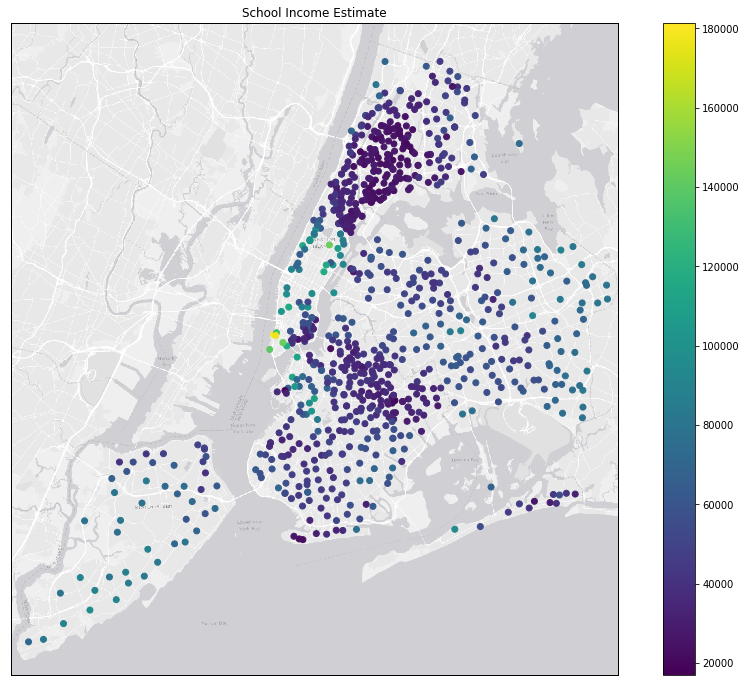

In [6]:
plot_continuous_map(df['School Income Estimate'], df)

### Economic Need Index

This measures the poverty among *students*.

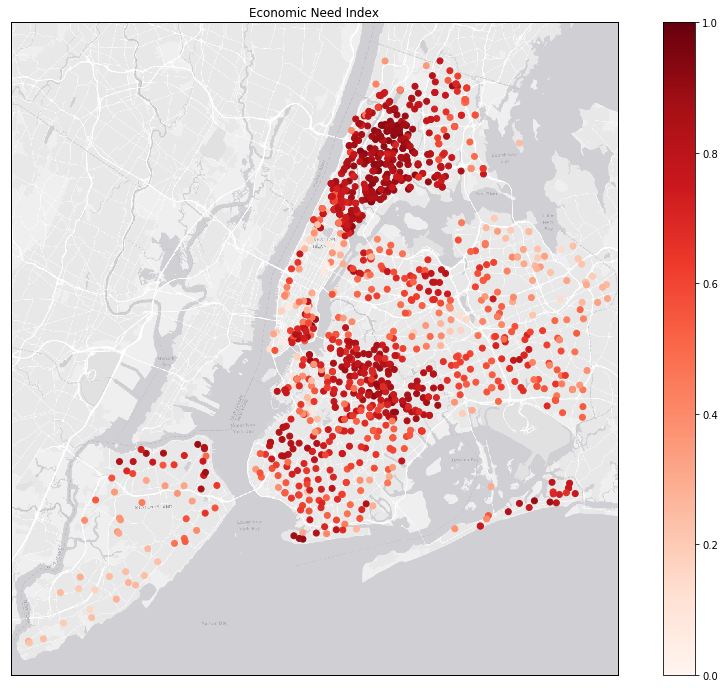

In [7]:
plot_continuous_map(df['Economic Need Index'], df, vmin=0, vmax=1, cmap='Reds')

### Percentual of ELL (English Language Learners)

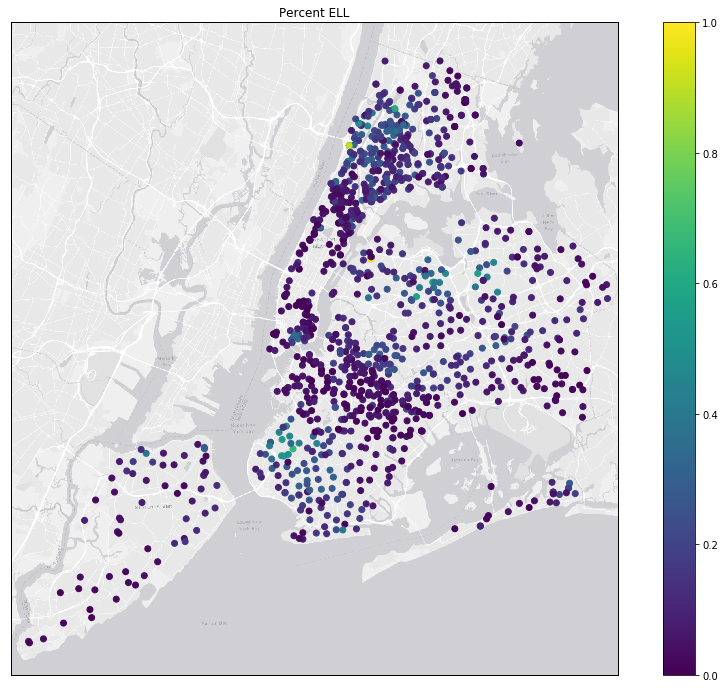

In [8]:
plot_continuous_map(df['Percent ELL'], df, vmin=0, vmax=1)

### Student Attendance Rate

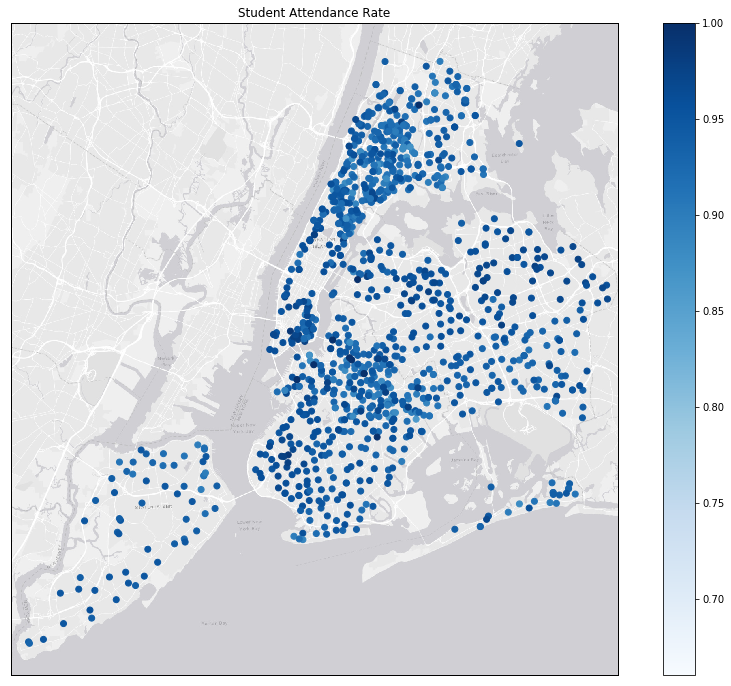

In [9]:
plot_continuous_map(df['Student Attendance Rate'], df, cmap="Blues")

### Percent of Students Chronically Absent

A student is considered chronically absent if he misses more than *10%*  of his classes.

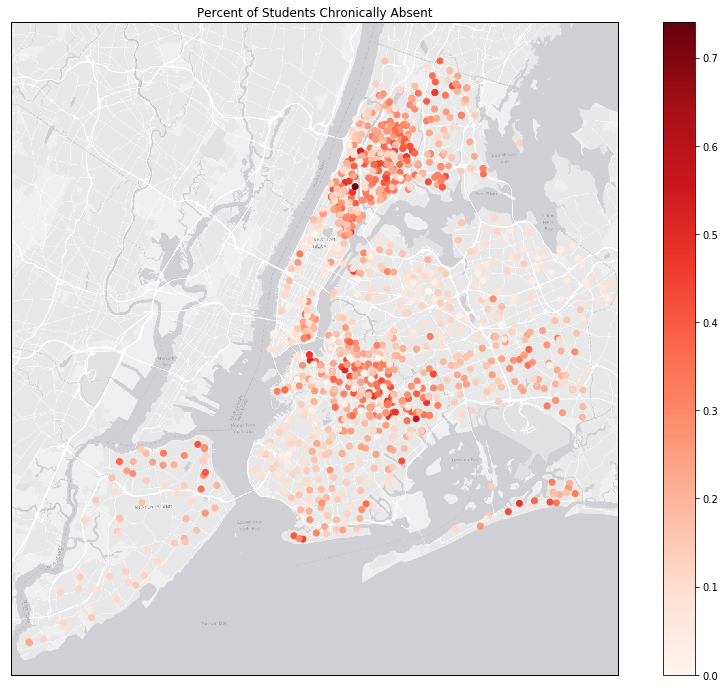

In [10]:
plot_continuous_map(df['Percent of Students Chronically Absent'], df, cmap="Reds")

### Average ELA (English Language Arts) Proficiency

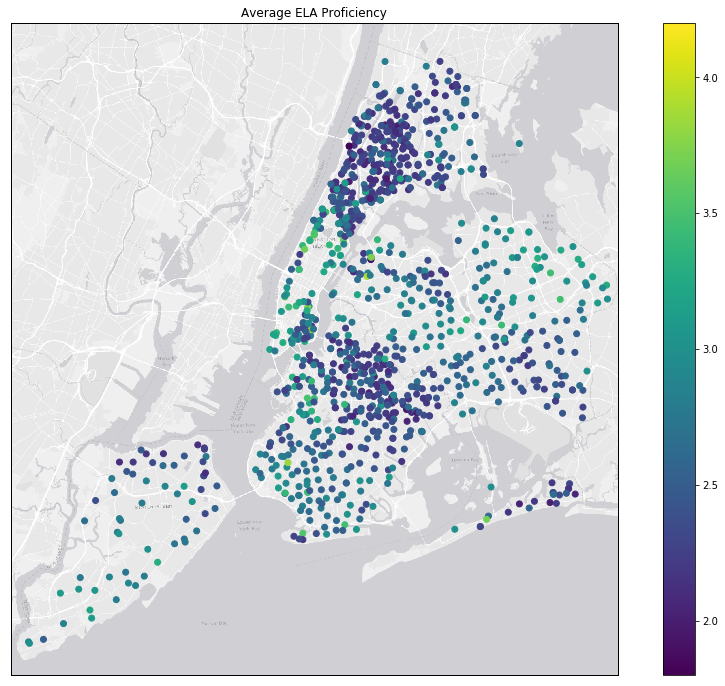

In [11]:
plot_continuous_map(df['Average ELA Proficiency'], df, vmin=1.8, vmax=4.2)  # normalize both proficiency cmaps

### Average Math Proficiency

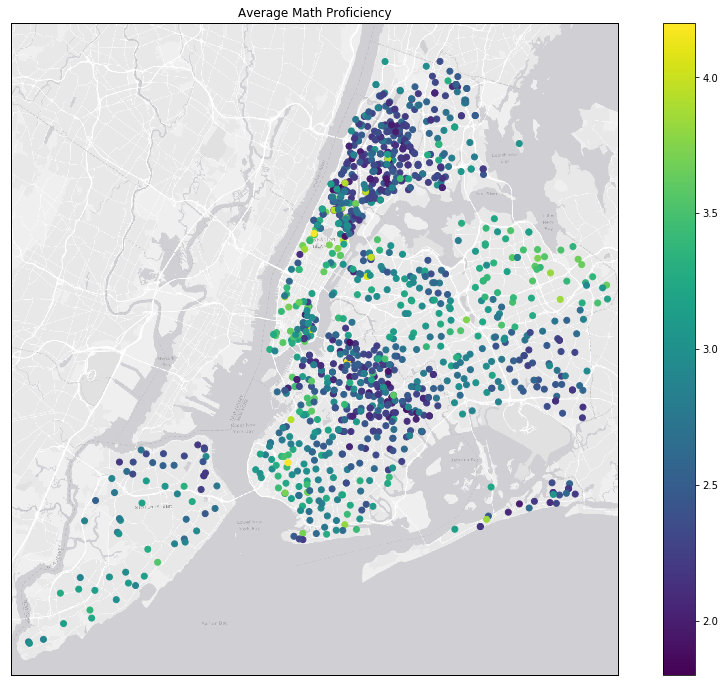

In [12]:
plot_continuous_map(df['Average Math Proficiency'], df, vmin=1.8, vmax=4.2)

I said I wouldn't comment, but, let me make a note. Look at the northeastern part of Brooklyn and at Bronx across all maps. These areas seem to be suffering in all the metrics we used (except 'Percent ELL', but this has no good or bad sides). Meaning... All school factors are probably interrelated with one another in some deeper sense.

![New York City - Boroughs](images/nyc-boroughs.jpg)

## Binary Categories

Here we will select some categories, and visualize the difference between the two groups of schools are are present or not in them.

### Community Schools

"A type of publicly funded school that serves as both an educational institution and a center of community life."

#### Map

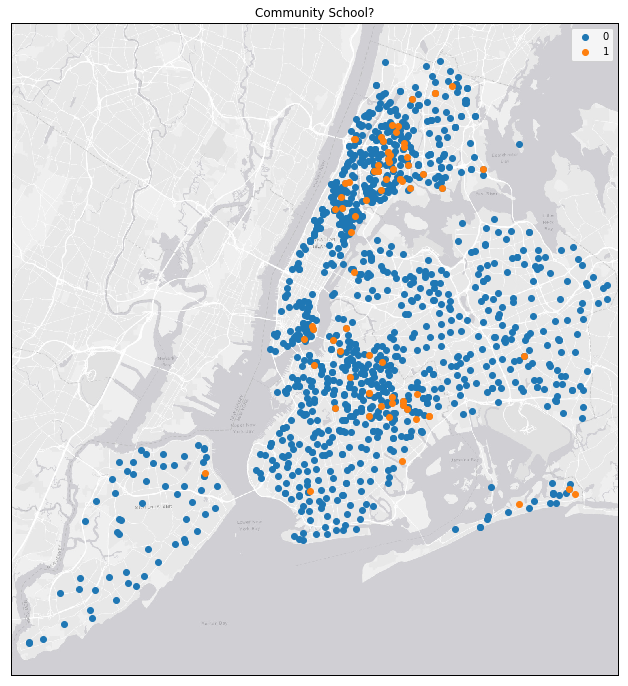

#### Schools Characteristics

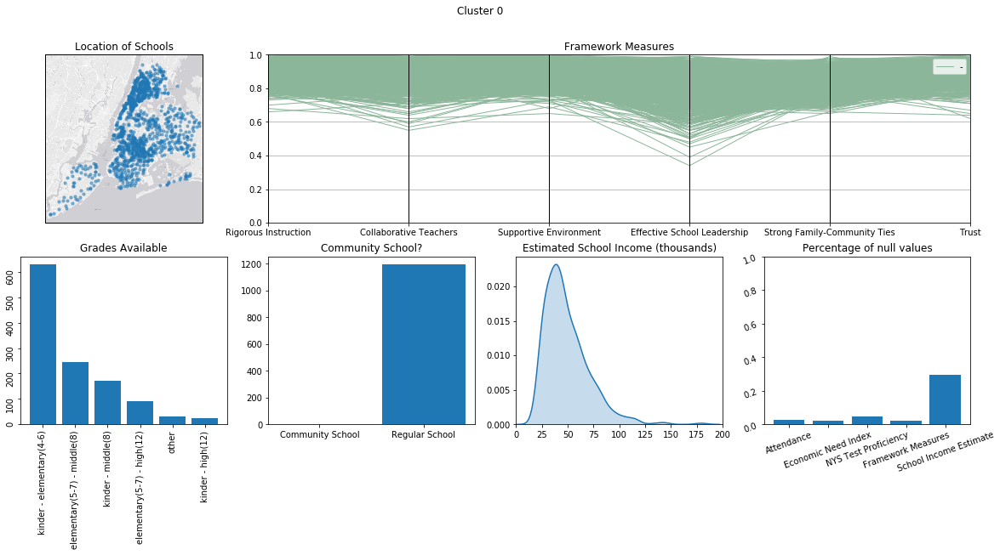

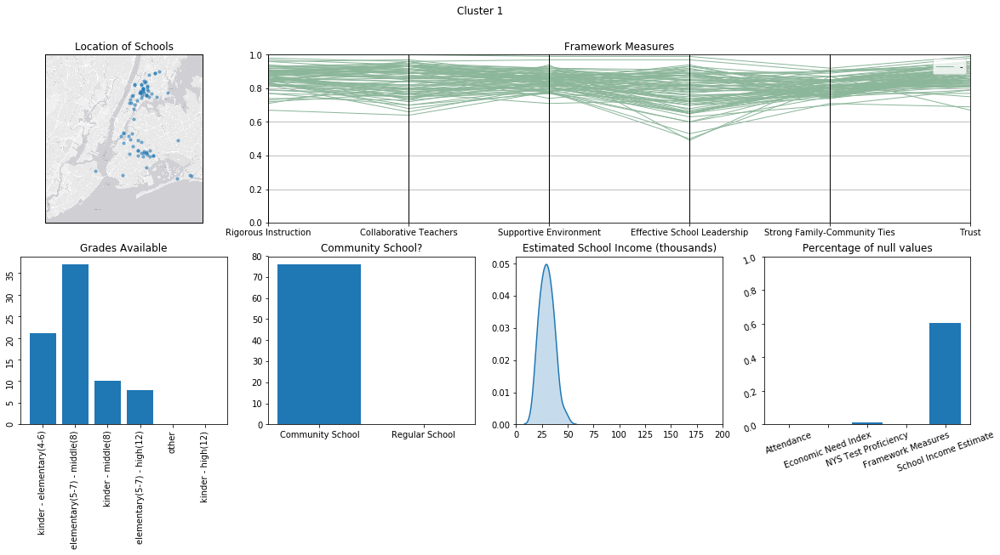

#### Students Characteristics

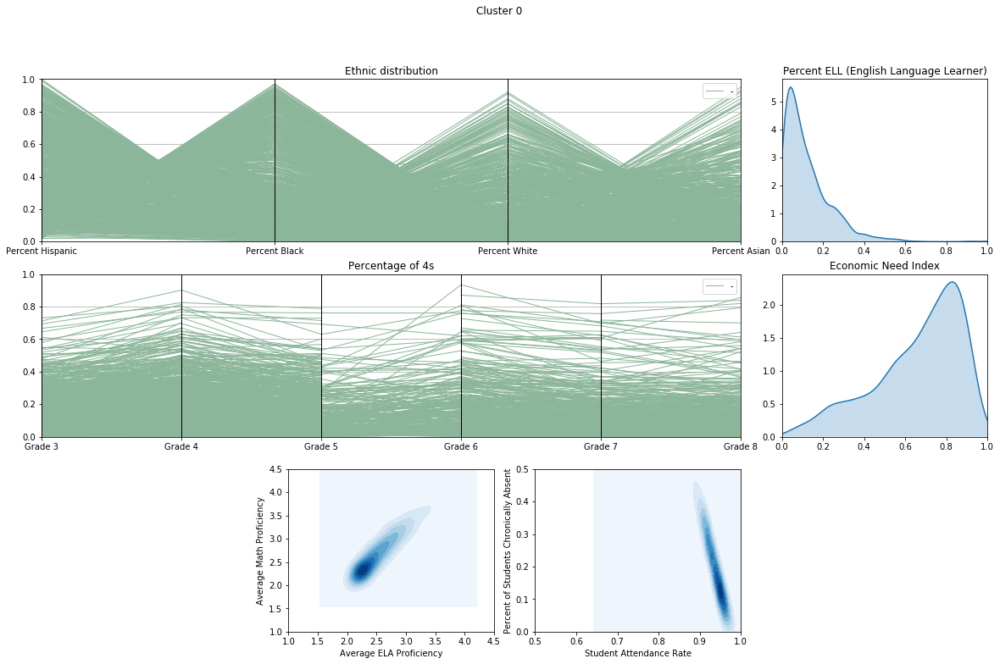

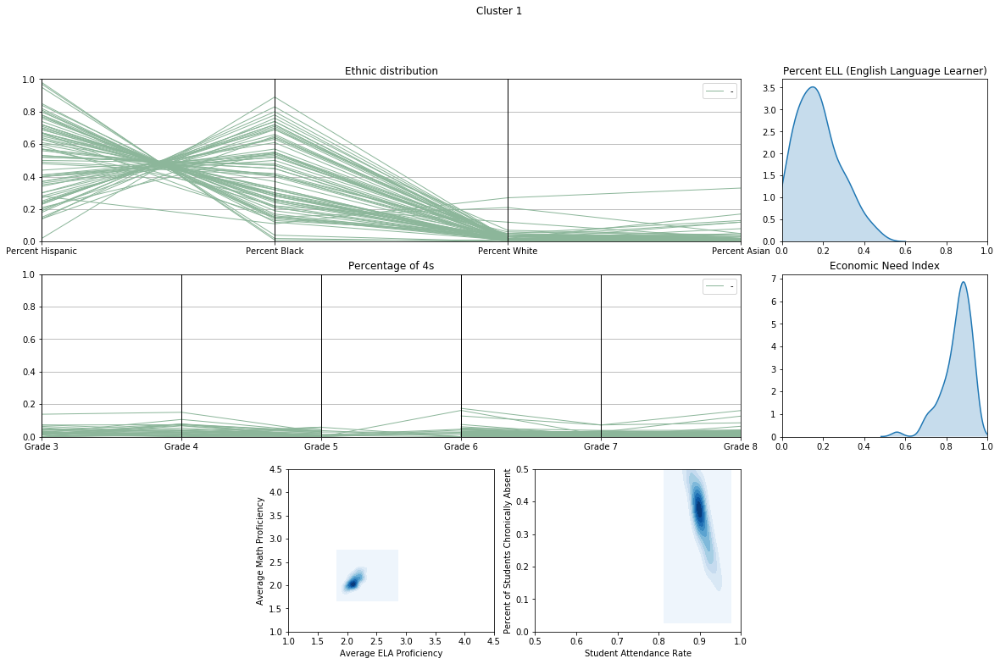

In [26]:
plot_clusters(df['Community School?'], df)

#### Remarks

*from now on I'll be doing remarks on things that may not be so obvious by looking at the plots (and some obvious things too)*

Community schools characteristics:

- They seem to be concentrated in the worst performing regions of the city
- The majority of them are middle schools (instead of elementary schools)
- Their income is cut at about \$60,000 (usual schools go up to \$200,000)
- There are more missing values (for the School Income Estimate)

Community school students characteristics:

- There are very few white and asian students
- There are a bit more of ELL
- Students are poorer
- Student performance and attendance are overall worse

Unintuitive findings:

- Despite having seemingly worse conditions, the performance of community schools on the NYC Framework for Great School is quite similar to that of regular schools

### Schools with Special Education (SE)

Special education is about teaching children who have special needs or behavioral problems.

#### Map

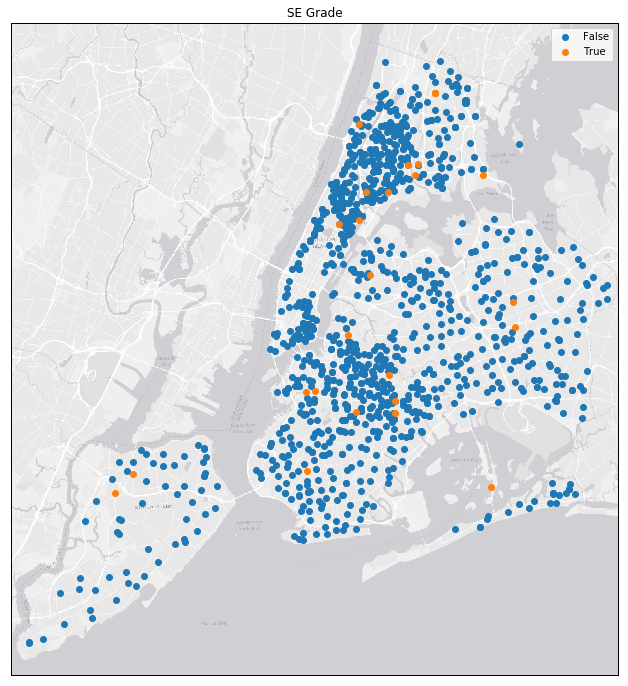

#### Schools Characteristics

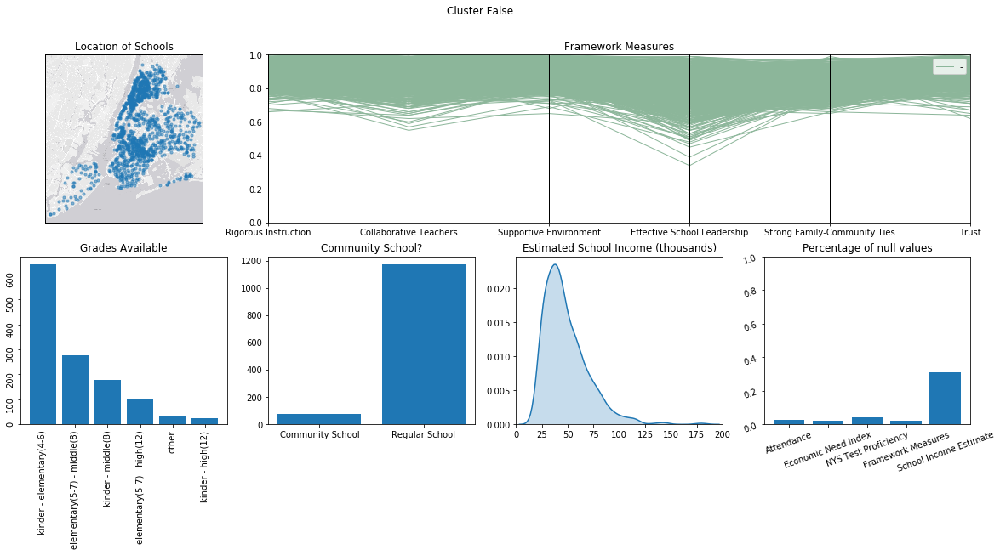

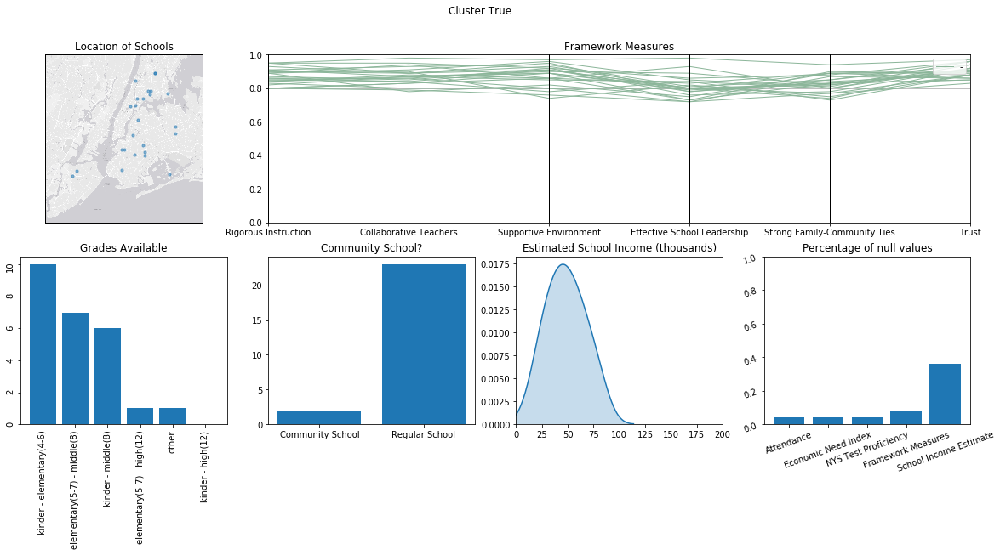

#### Students Characteristics

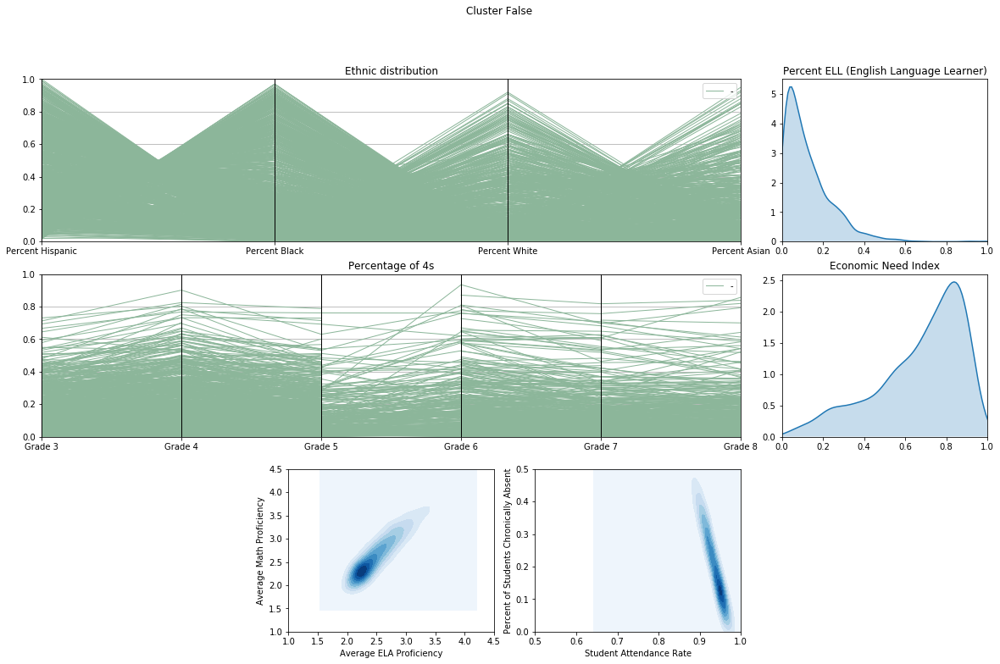

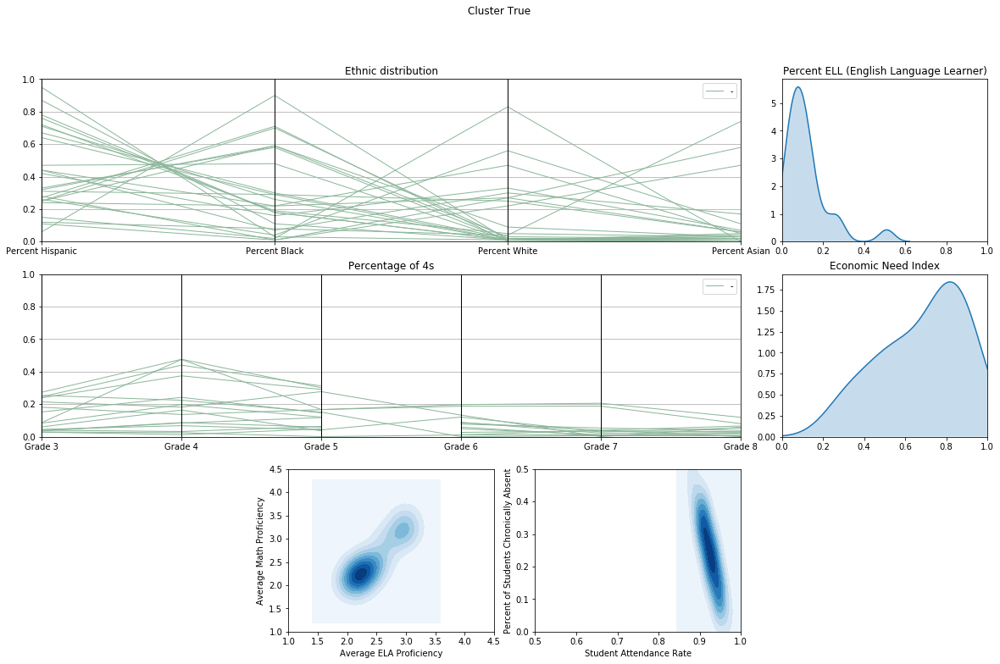

In [27]:
plot_clusters(df['SE Grade'], df)

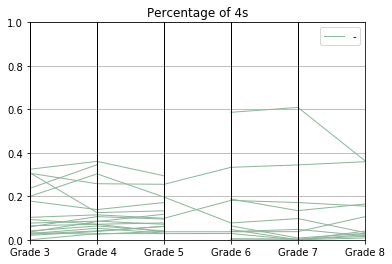

In [33]:
# checking if Percentage of 4s has fewer students than usual (yes!)

fig, ax = plt.subplots()
plot_percentage_of_4s(df.sample(25, random_state=1).index, ax)

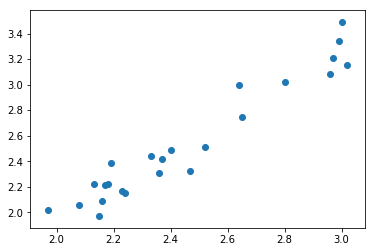

In [29]:
# checking if Average Proficiency has two clusters (no!)

d = df[df['SE Grade']]
plt.scatter(d['Average ELA Proficiency'], d['Average Math Proficiency']);

#### Remarks

There are only 25 schools with Special Education, and they look quite similar to the usual schools.

- *Perhaps* schools with a high overall student achievement don't have SE classes

### Schools with missing values

In [30]:
df.isnull().sum().sort_values(ascending=False).head(15)

School Income Estimate                    396
Average Math Proficiency                   55
Average ELA Proficiency                    55
Student Attendance Rate                    35
Percent of Students Chronically Absent     35
Rigorous Instruction %                     28
Trust %                                    26
Strong Family-Community Ties %             26
Effective School Leadership %              26
Supportive Environment %                   26
Collaborative Teachers %                   26
Economic Need Index                        25
Percent Asian                               0
Longitude                                   0
Community School?                           0
dtype: int64

Most missing values are in the School Income Estimate. Missing values are also present in:

- Average NYS Test Proficiency
- Student Attendance
- NYC Framework measures
- Economic Need Index

Since there are a lot of sources of NA, let's just look at 'School Income Estimate available'.

### Schools missing Income Estimate

#### Map

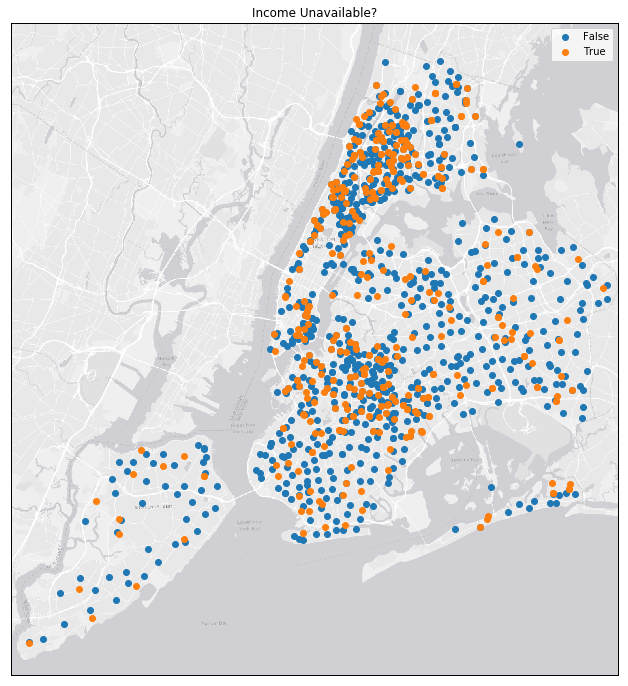

#### Schools Characteristics

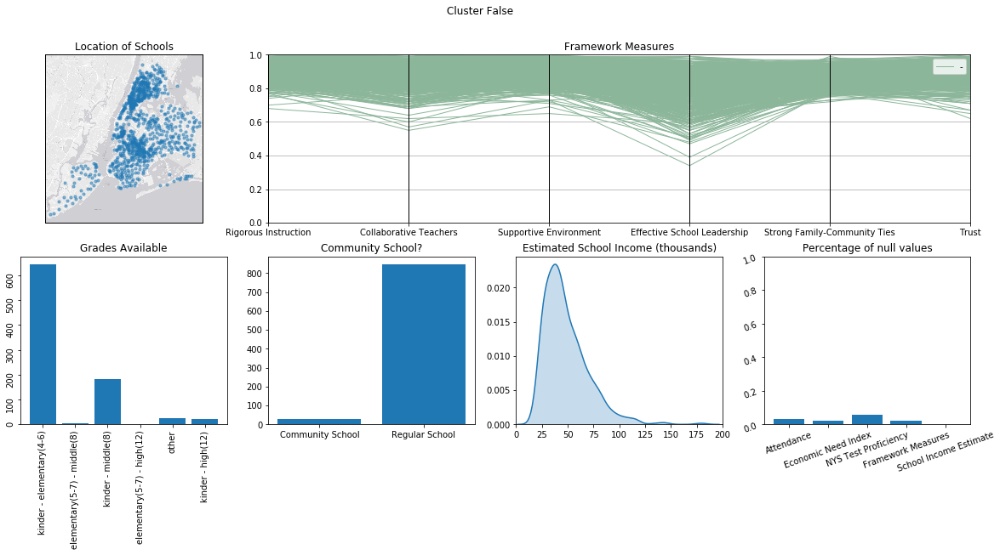

/home/andre/miniconda3/envs/passnyc/lib/python3.6/site-packages/seaborn/distributions.py:195: RuntimeWarning: Mean of empty slice.
  line, = ax.plot(a.mean(), 0)
/home/andre/miniconda3/envs/passnyc/lib/python3.6/site-packages/numpy/core/_methods.py:80: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


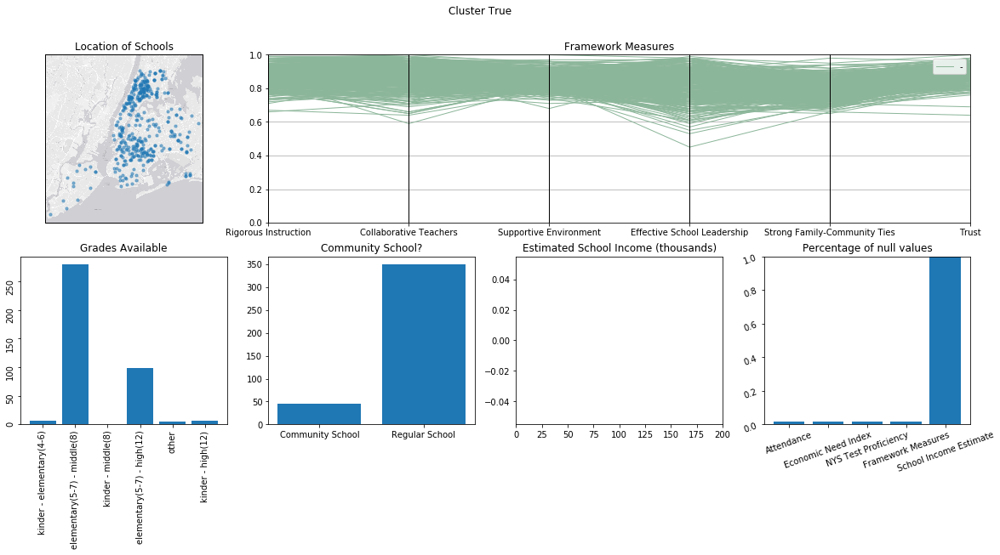

#### Students Characteristics

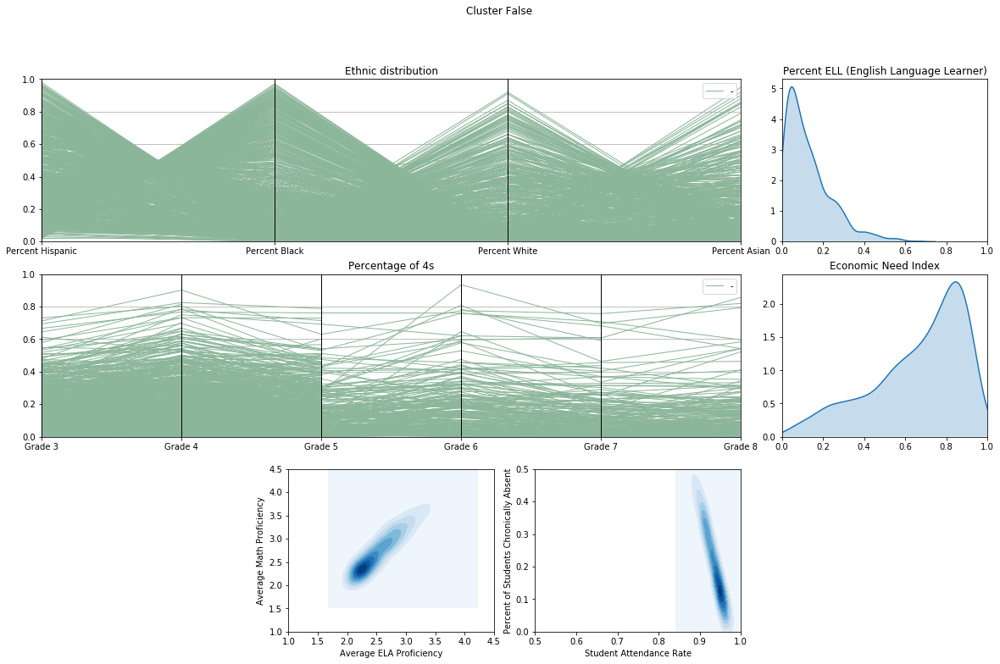

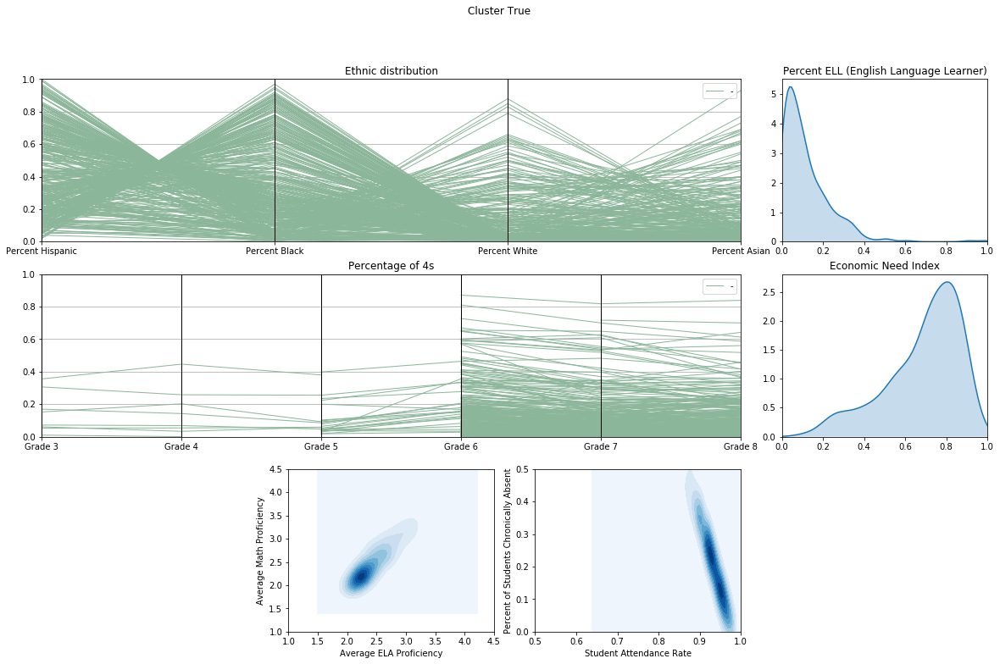

In [39]:
income_na = df['School Income Estimate'].isnull().rename('Income Unavailable?')
plot_clusters(income_na, df)

## Multi-valued categories

Here we will visualize categories which have more than 1 value.

### Borough

New York is composed of five boroughs:

- Manhattan
- Brooklyn
- Queens
- Bronx
- Staten Island

#### Map

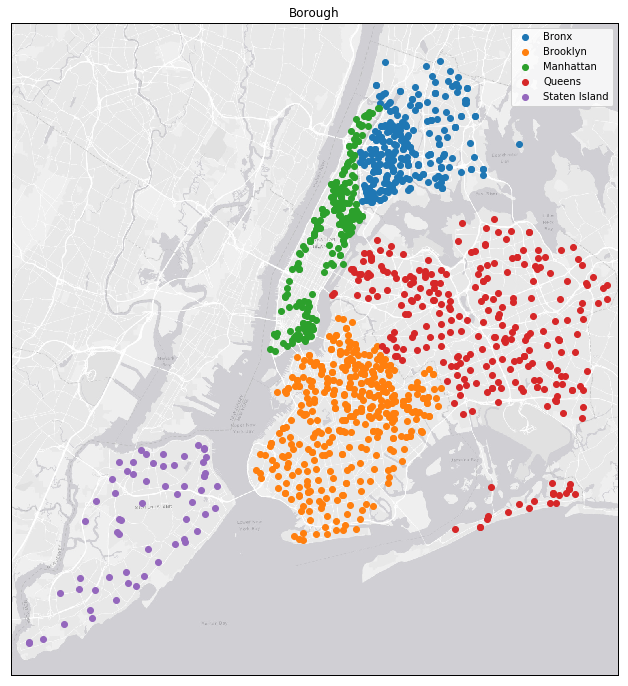

#### Schools Characteristics

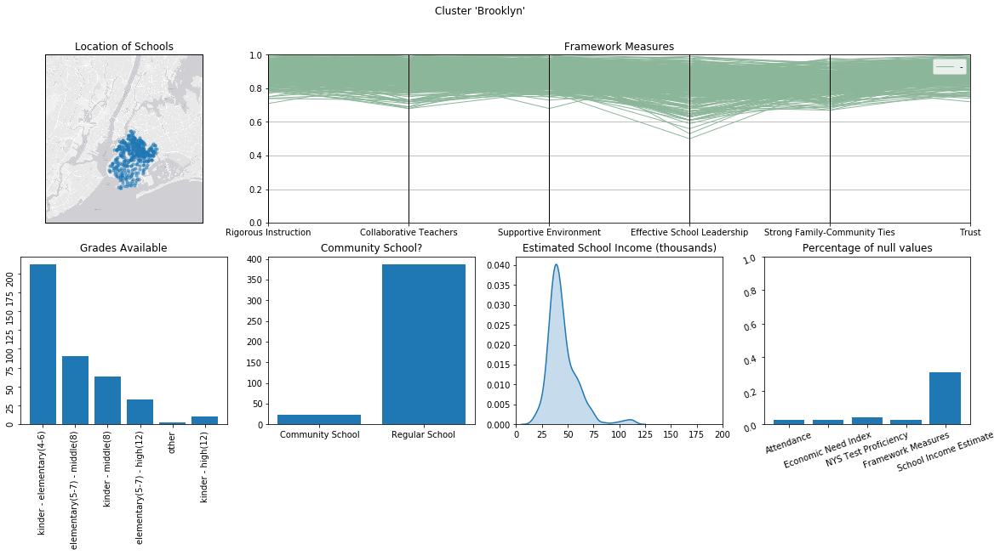

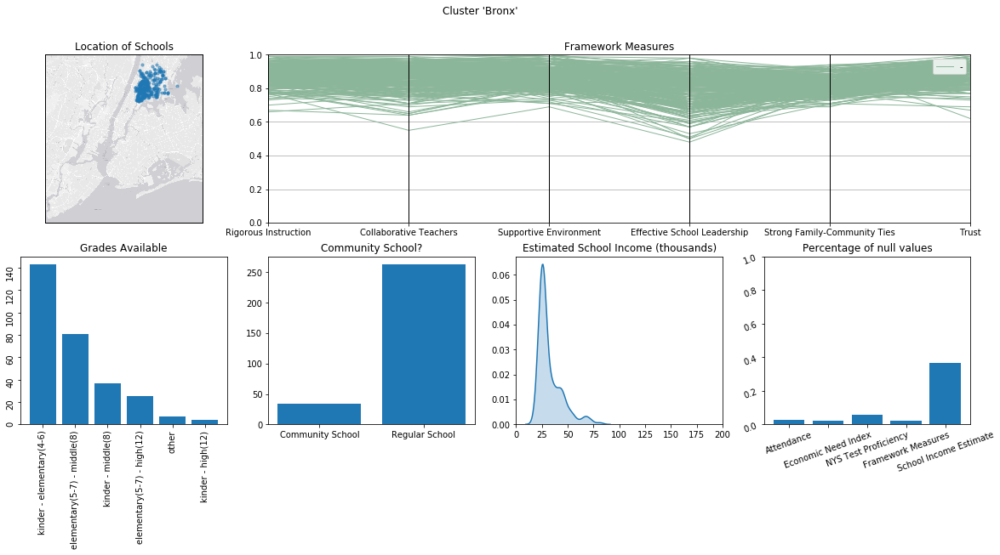

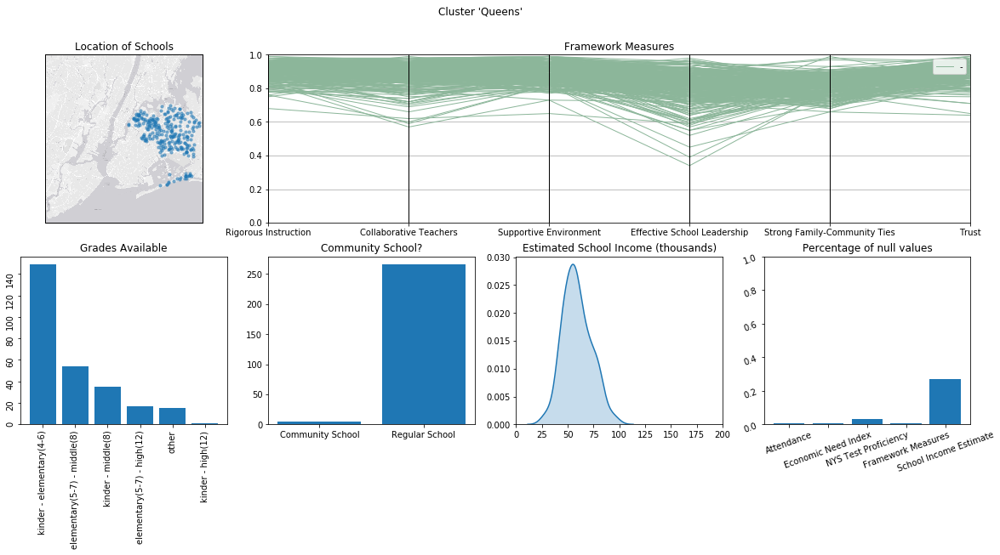

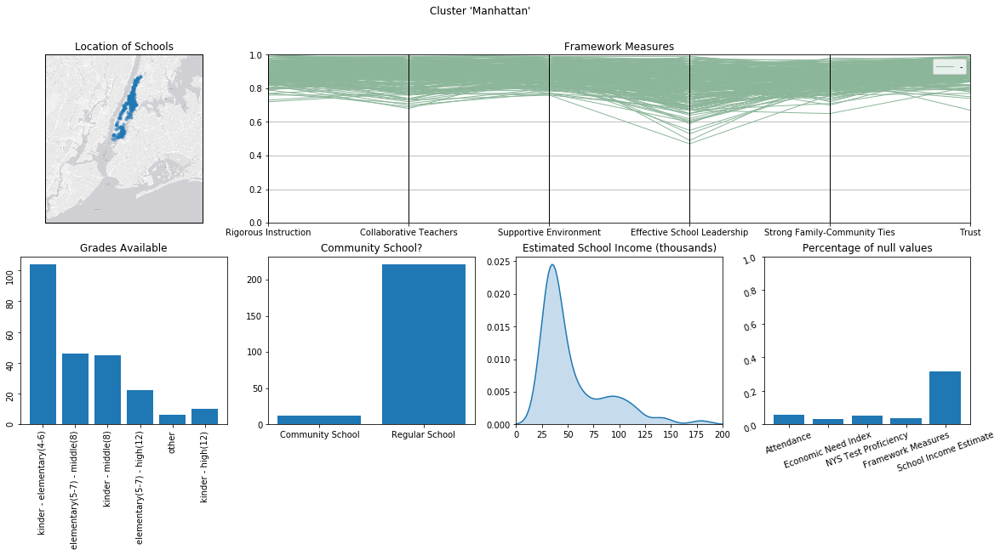

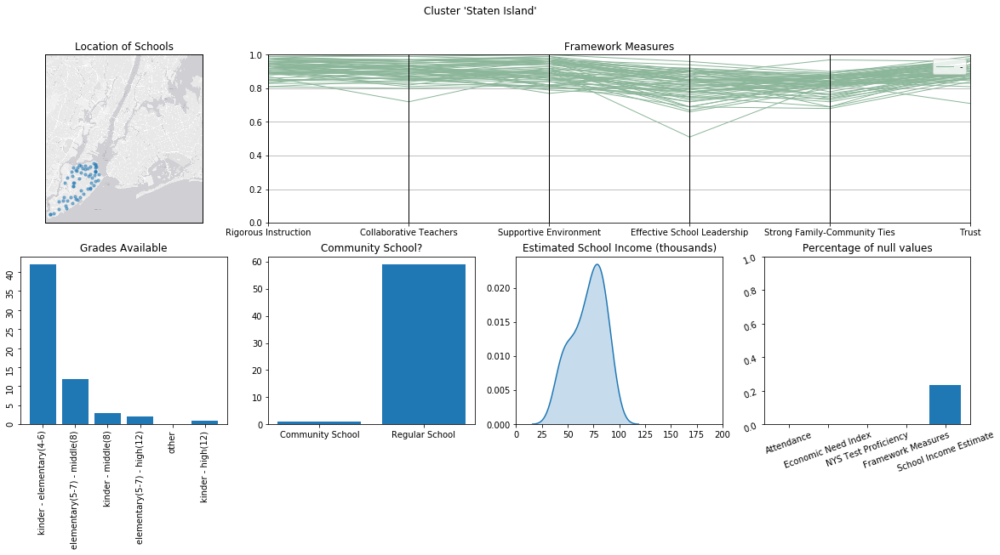

#### Students Characteristics

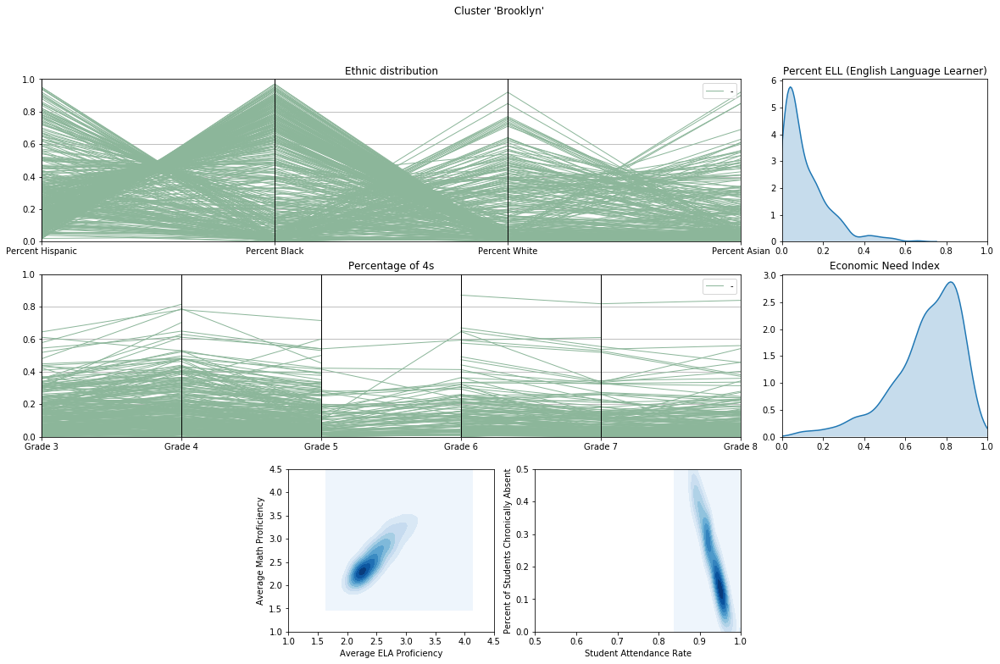

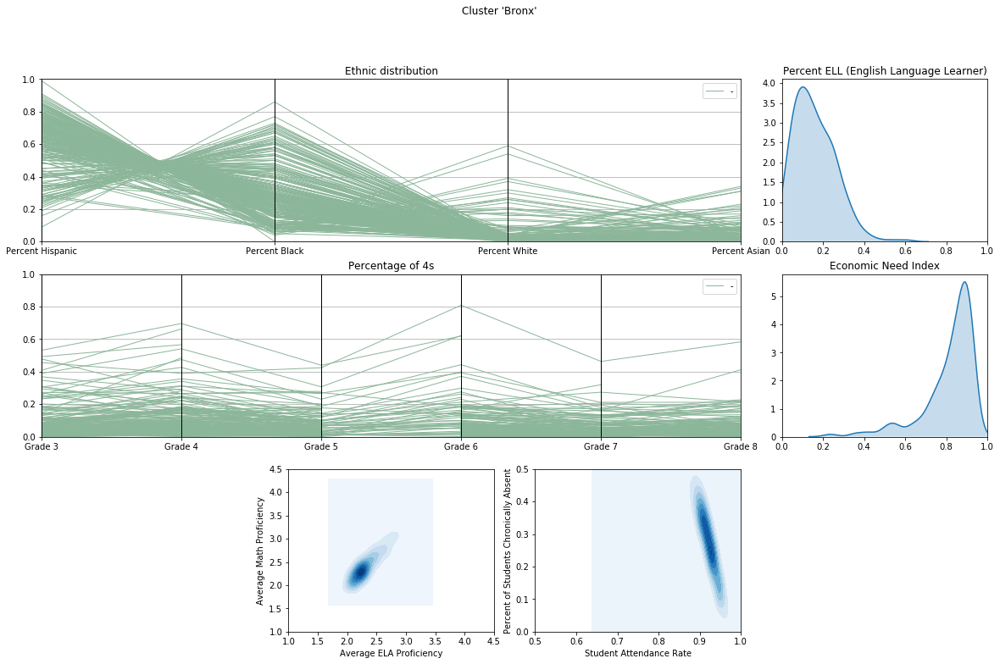

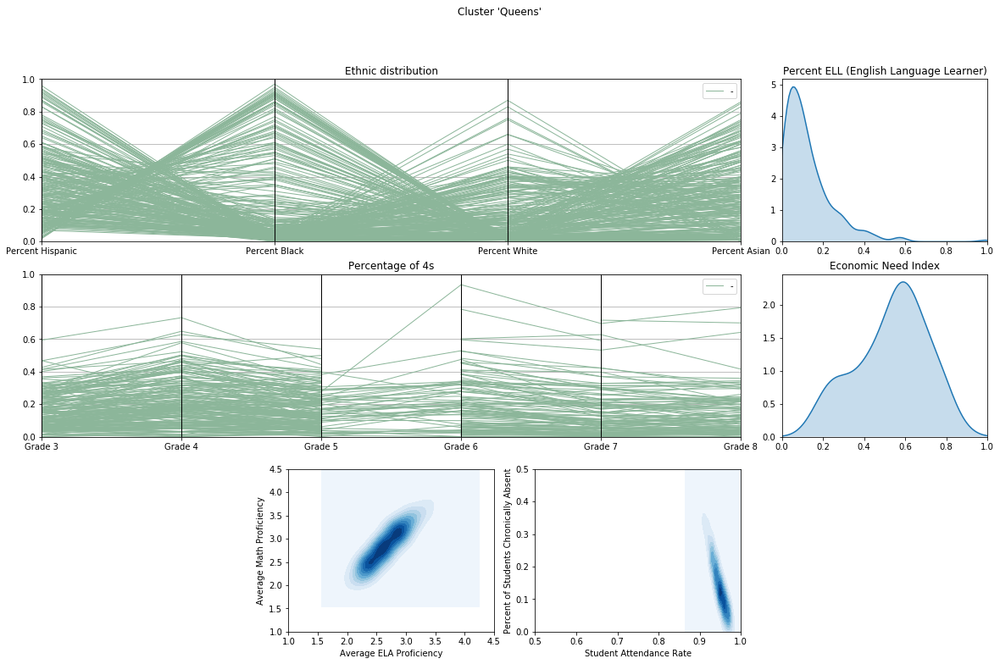

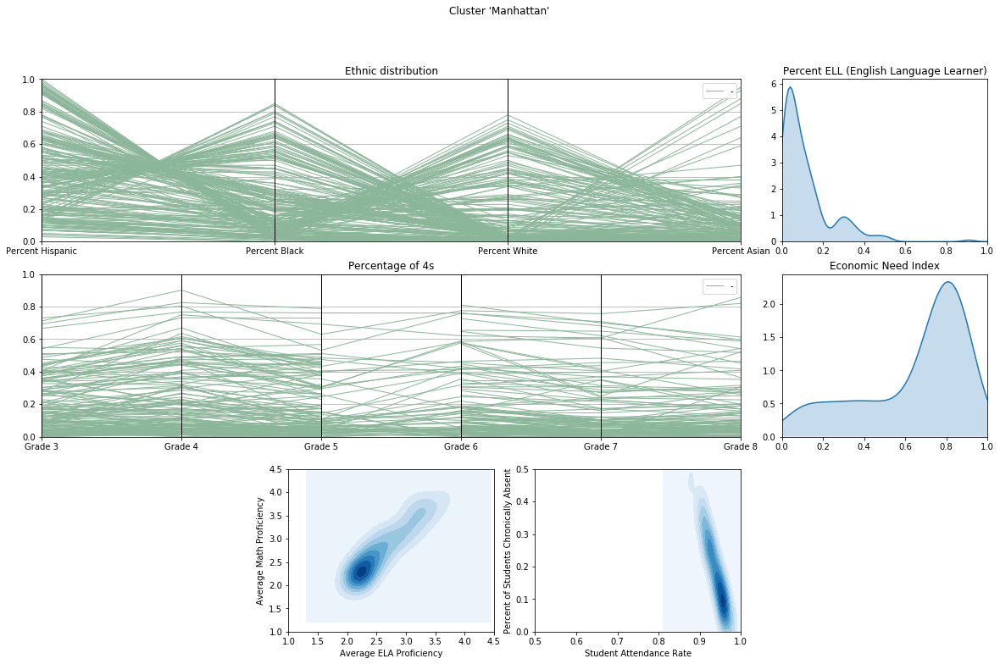

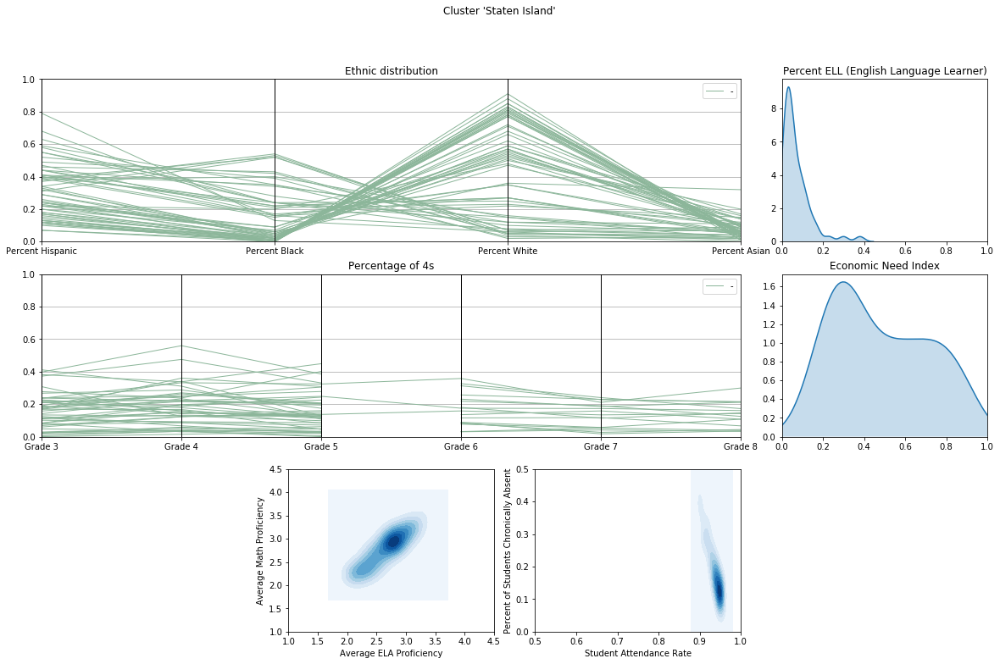

In [40]:
plot_clusters(df['Borough'], df)

In [ ]:
df.groupby('Borough')['Effective School Leadership %'].describe()

In [ ]:
df.groupby('Borough')['Strong Family-Community Ties %'].describe()

In [ ]:
df.groupby('Borough')['School Income Estimate'].describe()

In [ ]:
df.groupby('Borough')['Percent ELL'].describe()

#### Remarks

The differances are *huge* among different boroughs.

- Some boroughs seem to have a slightly lower score in the NYC Framework for Great Schools. The most prominent differences are in the 'Strong Family-Community Ties %' and 'Effective School Leadership %' (Bronx is the worst performer in both categories). This may indicate possible areas of intervention in the schools themselves and also, *possible areas where PASSNYC may have difficulties*.

  A more in depth analysis of the framework measures will be performed later.
 
- Staten Island has no null values (except for School Income Estimate). This is parcially due to the fact that there are only 60 schools in Staten Island but may also reflect some deeper meaning of the missing values. This will be studied later.

- The economic need index changes a lot from borough to borough. This indicates some kind of economic partitioning in the city.

- The performance of students also changes a lot. Manhattan has some of the best performat schools.

### Available grades

These are increasingly catching my attention... Let's take a look.

#### Map

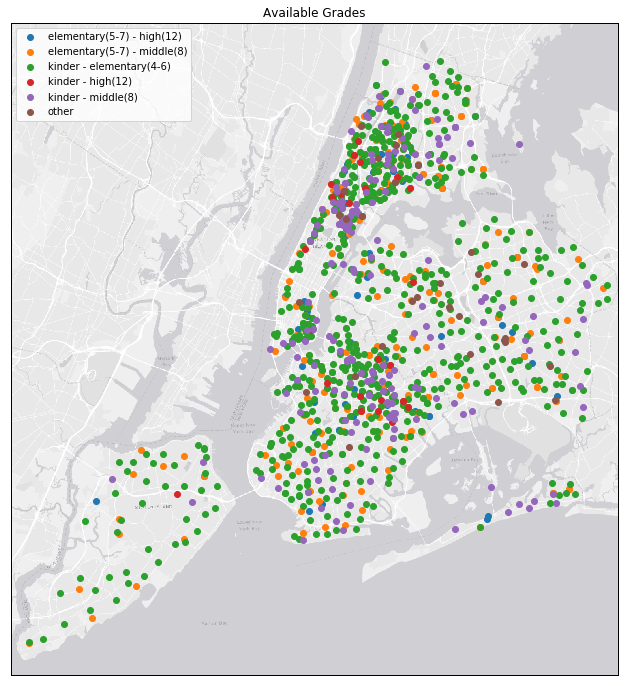

#### Schools Characteristics

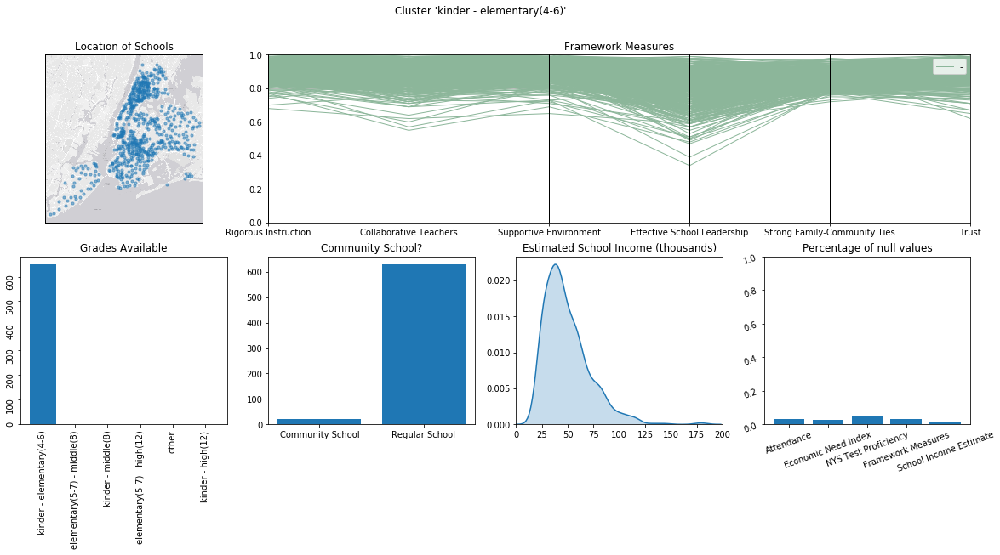

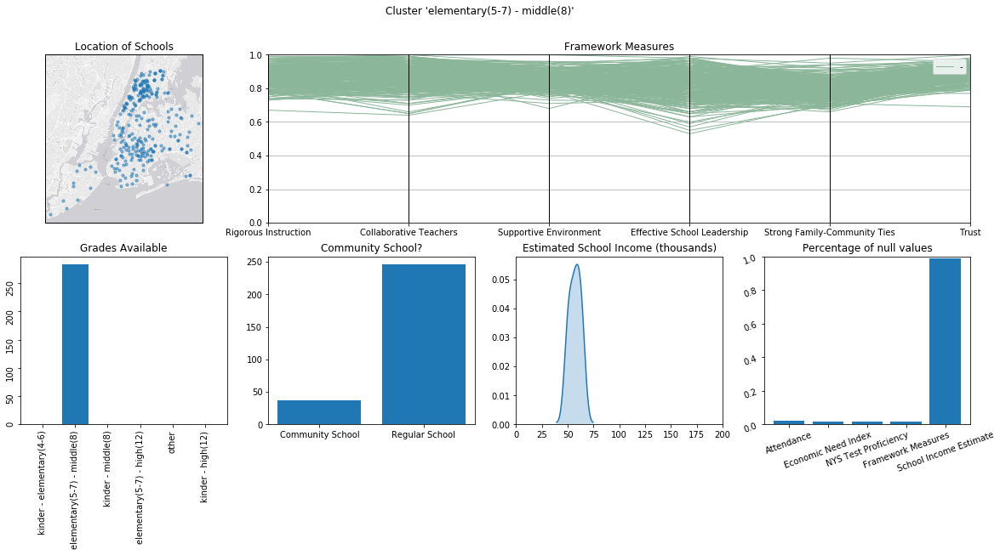

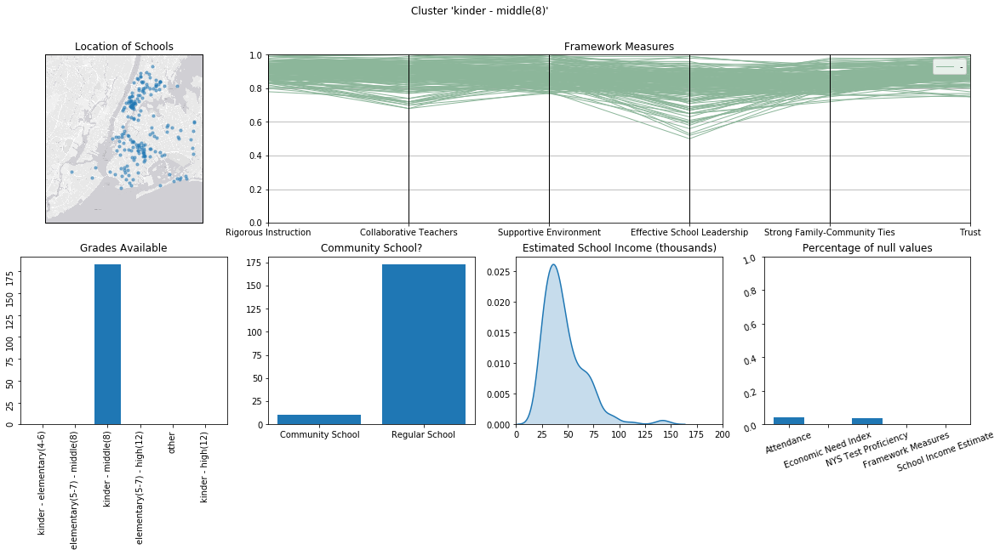

/home/andre/miniconda3/envs/passnyc/lib/python3.6/site-packages/seaborn/distributions.py:195: RuntimeWarning: Mean of empty slice.
  line, = ax.plot(a.mean(), 0)
/home/andre/miniconda3/envs/passnyc/lib/python3.6/site-packages/numpy/core/_methods.py:80: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


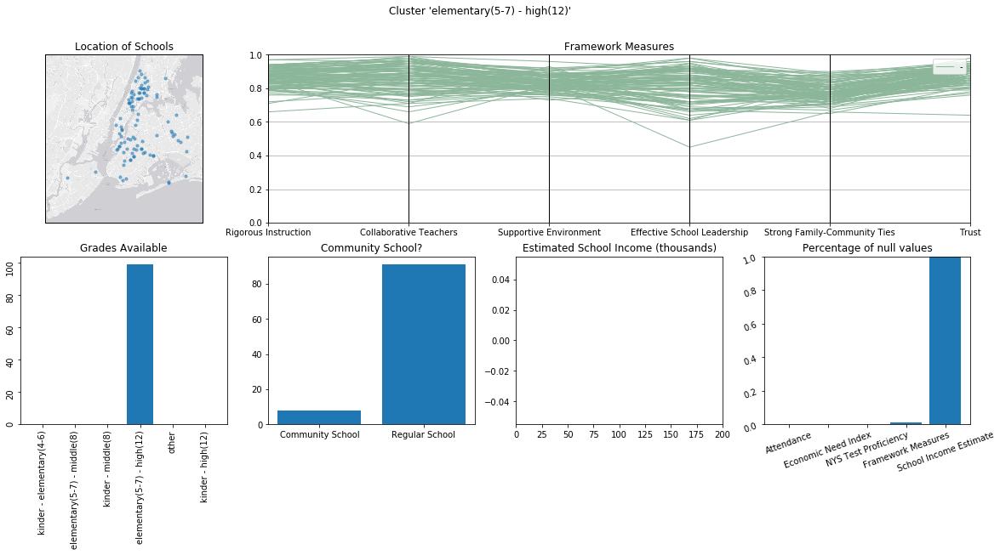

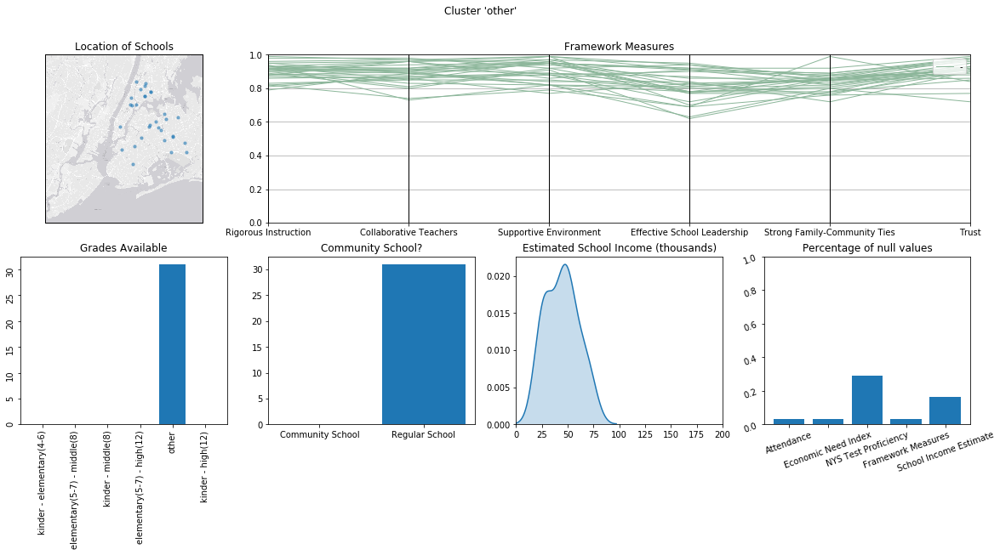

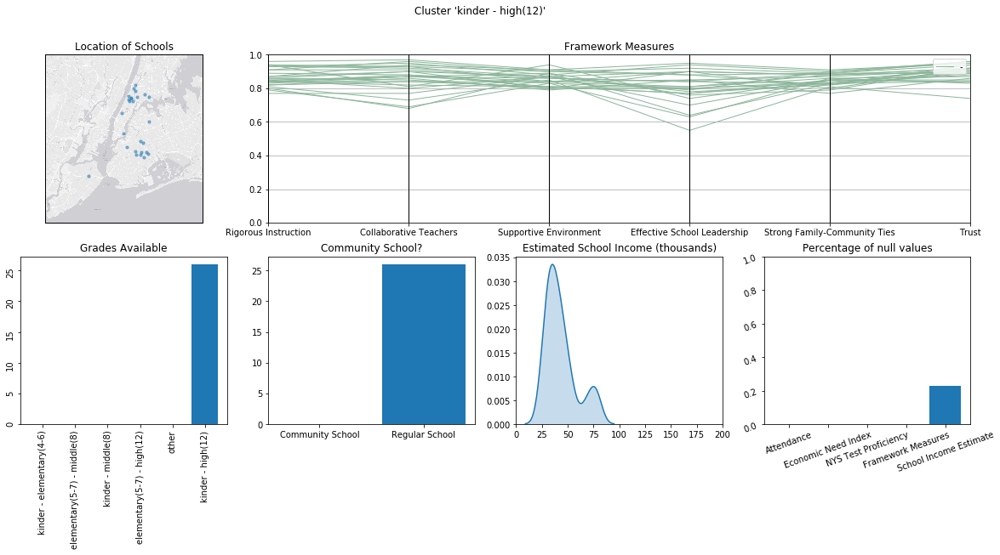

#### Students Characteristics

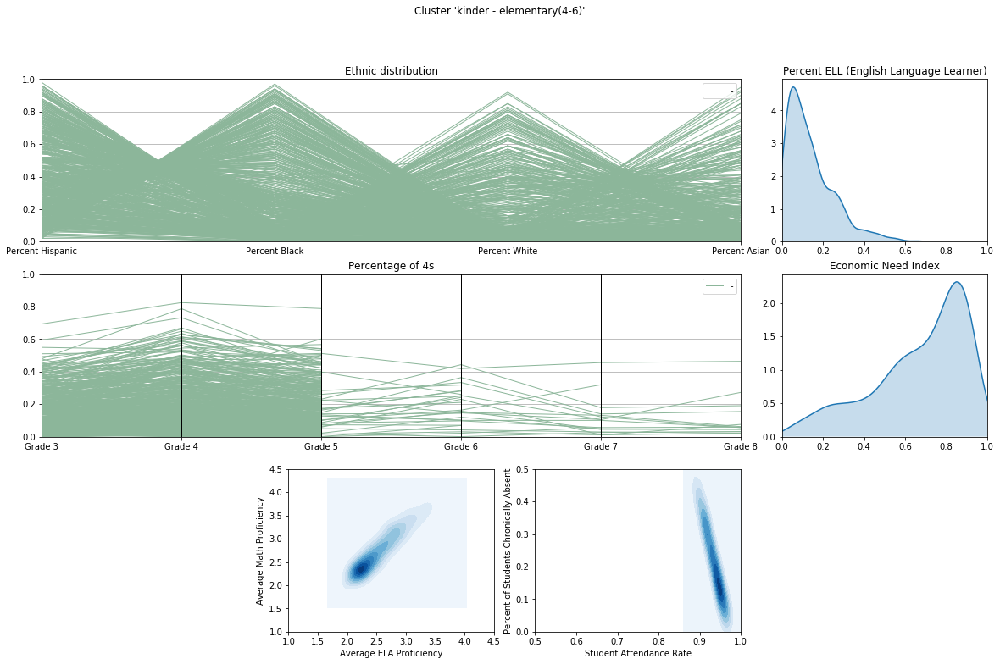

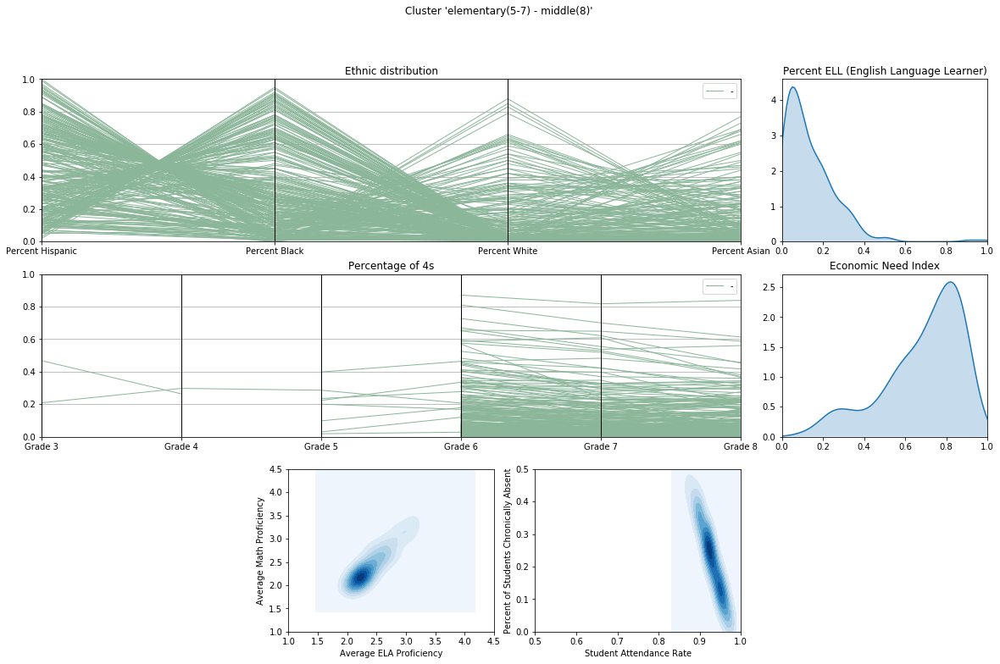

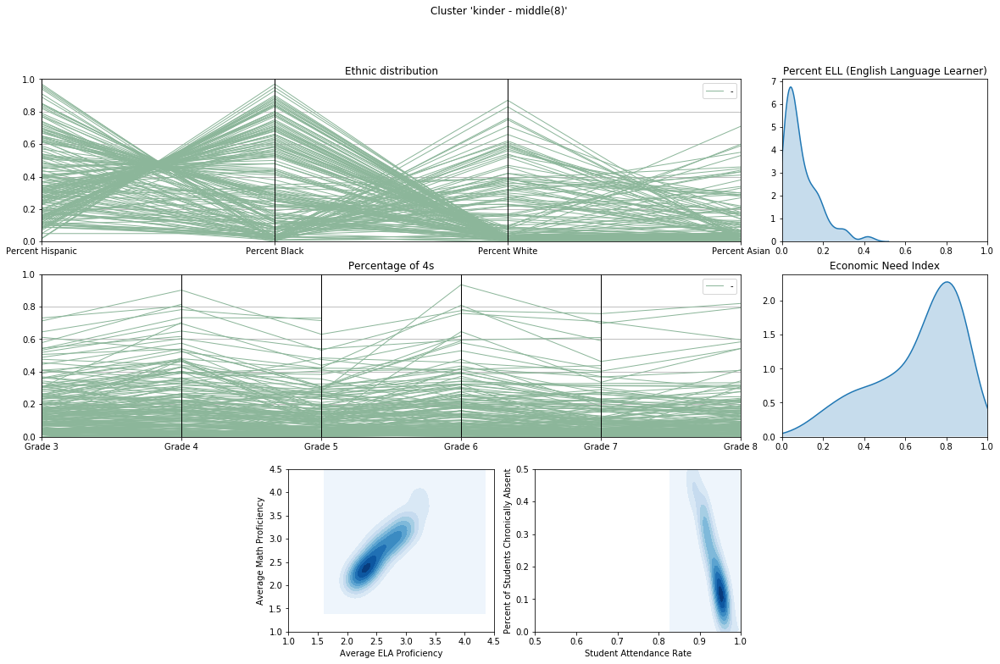

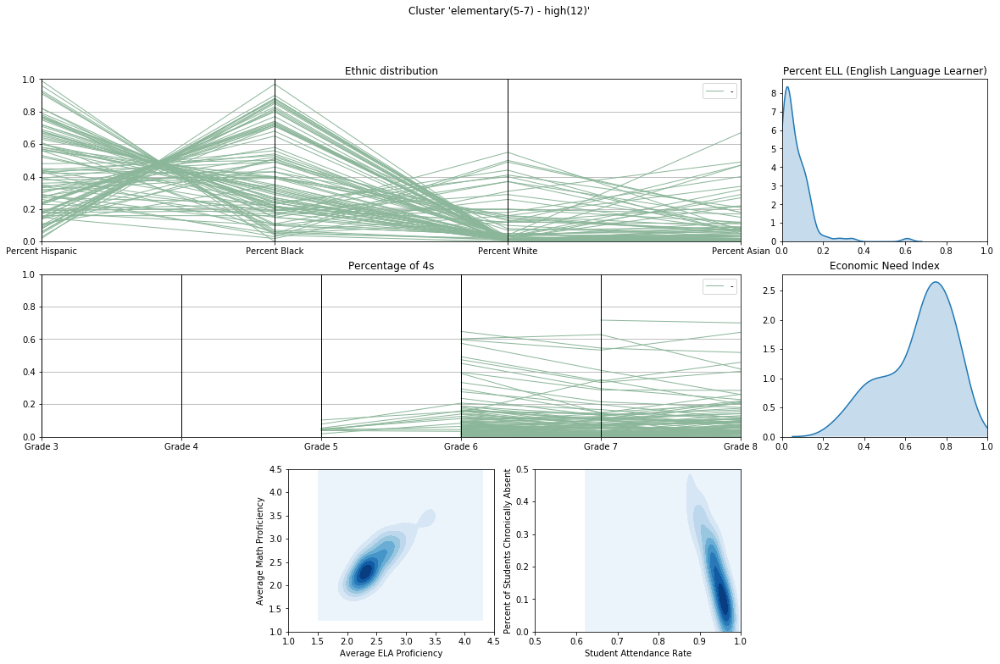

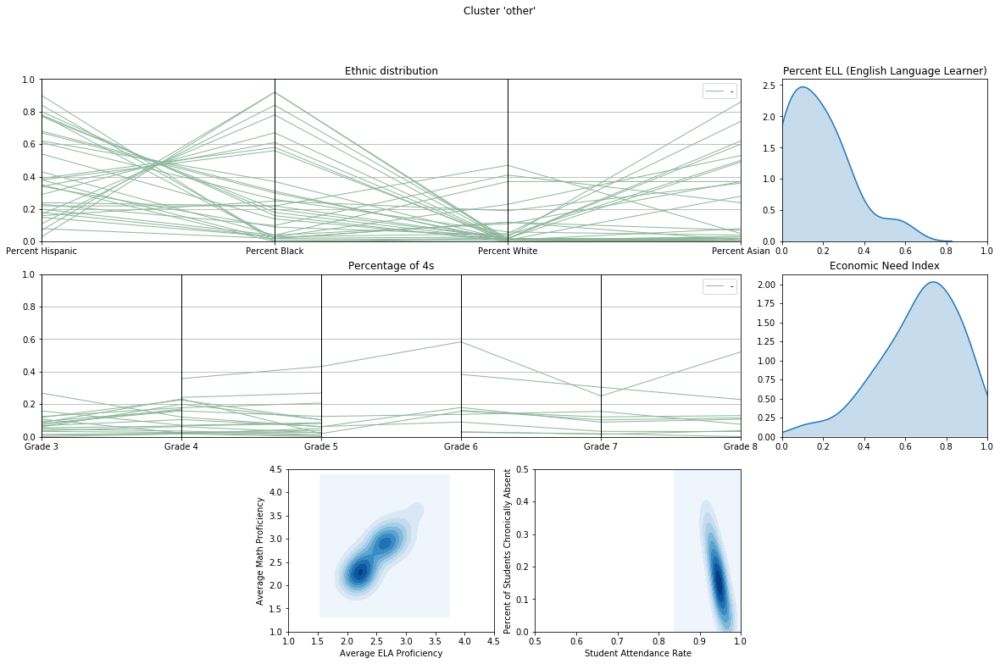

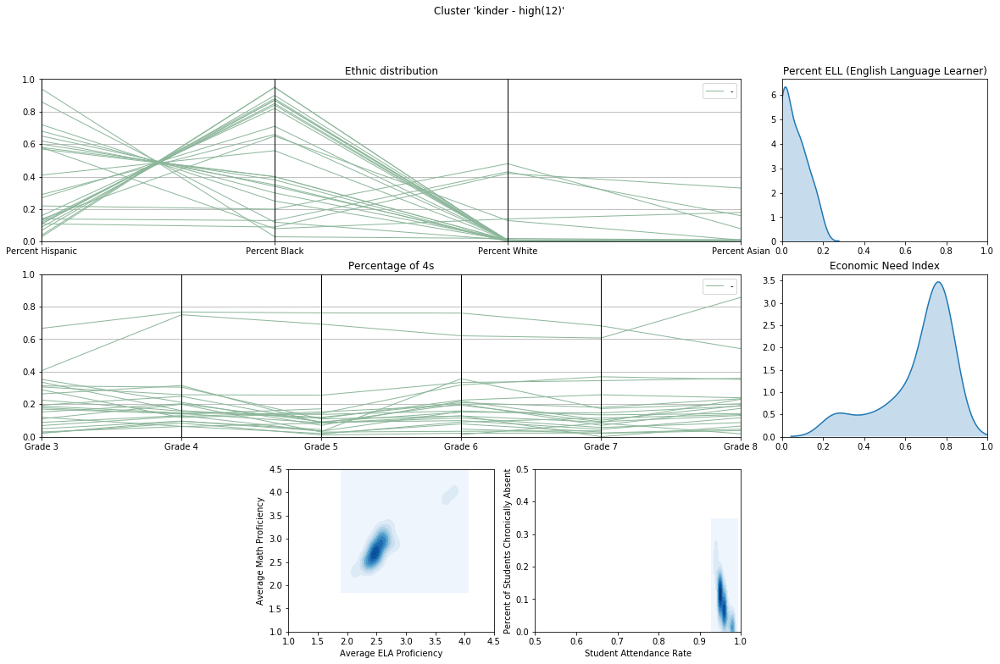

In [42]:
plot_clusters(df['Available Grades'], df)

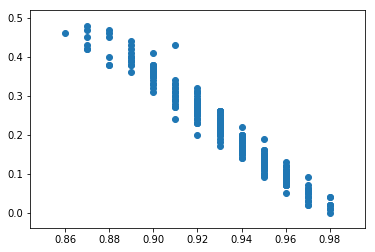

In [45]:
_aa = df[df['Available Grades'] == 'elementary(5-7) - middle(8)']
plt.scatter(_aa['Student Attendance Rate'], _aa['Percent of Students Chronically Absent'])

#### Remarks

There seems to be some difference in general. I won't look into them much closer.

- This finishes with the NA case. Almost all schools that start at the kindergarten have the value 'School Income Estimate', while almost all other schools don't.
- There is an apparent clustering in the attendance of typical middle schools (5,6,7 to 8th grade)

### Other kinds of NA

While we understood the main factor for a school to have a missing 'School Income Estimate Value', there are another NAs. Let's look if there is an evident relation among schools with them.

#### Map

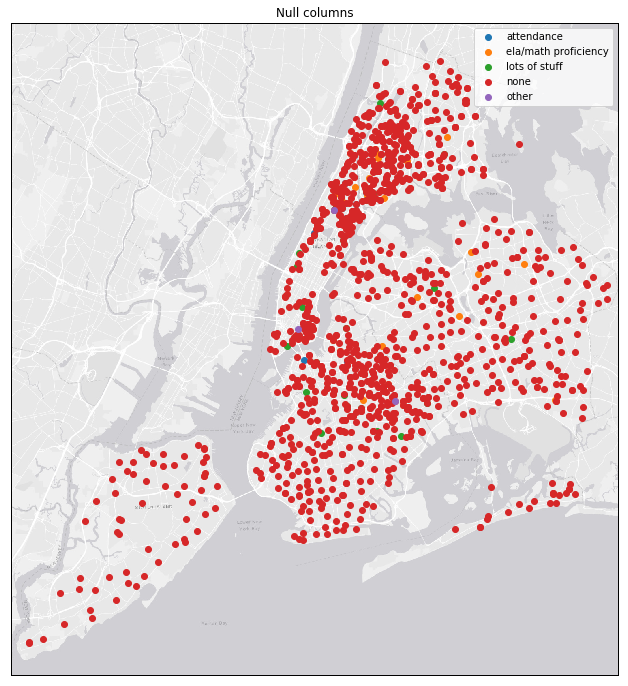

#### Schools Characteristics

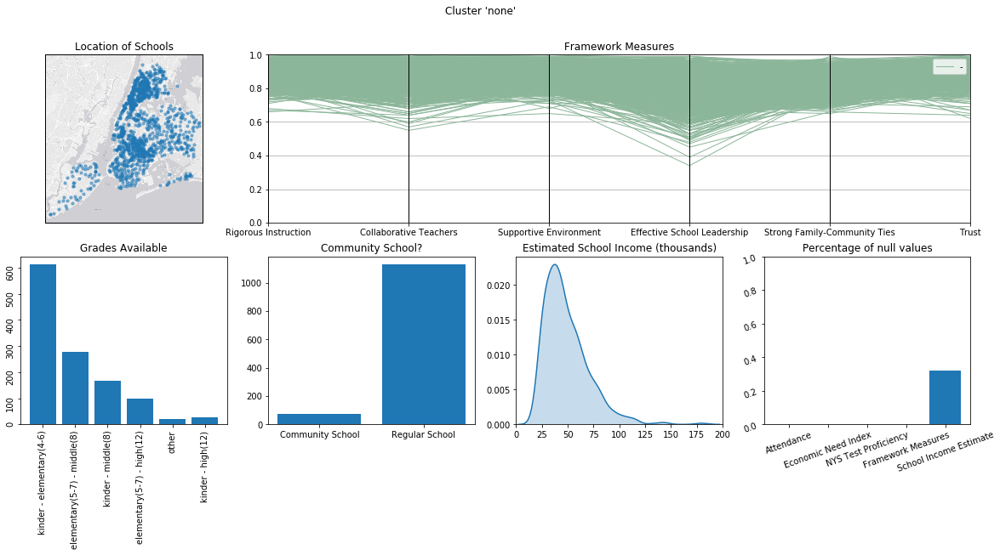

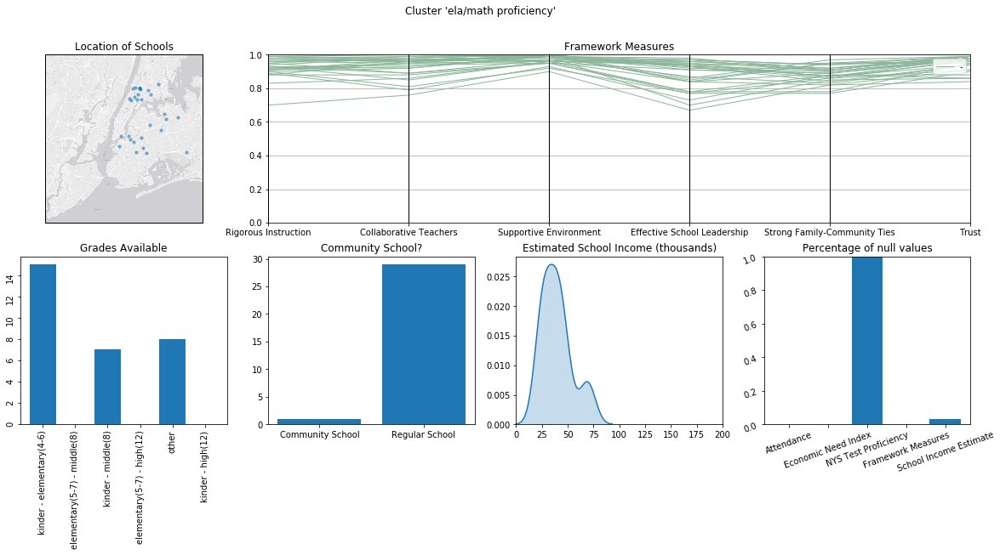

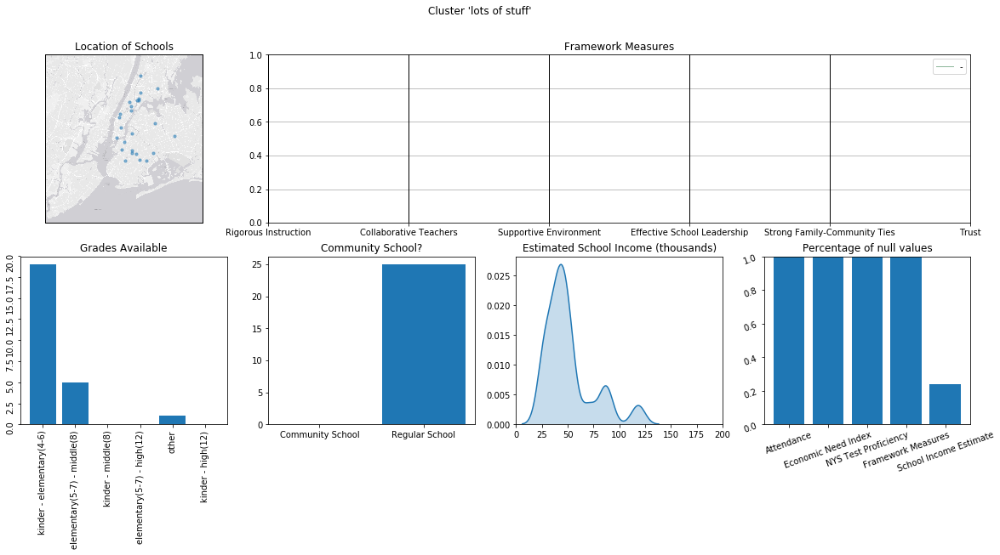

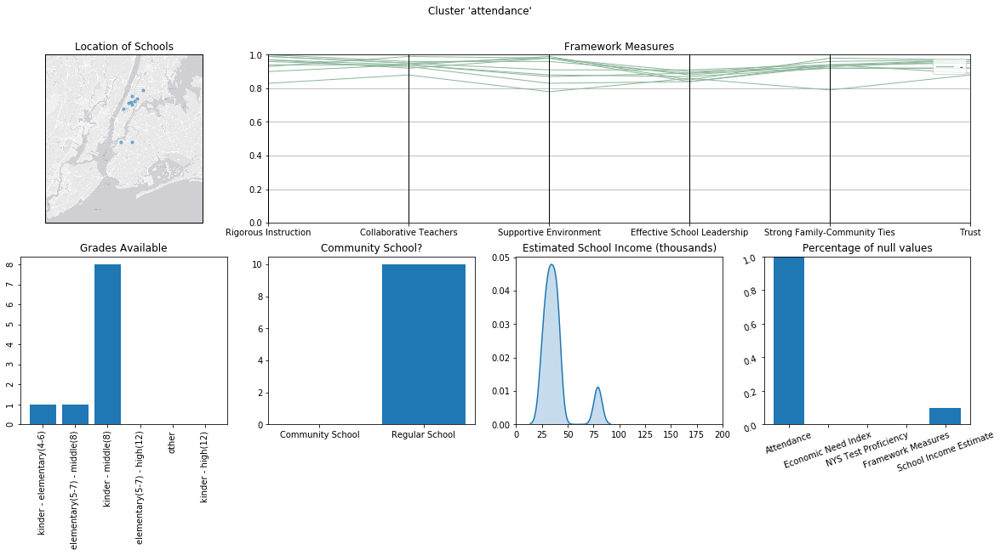

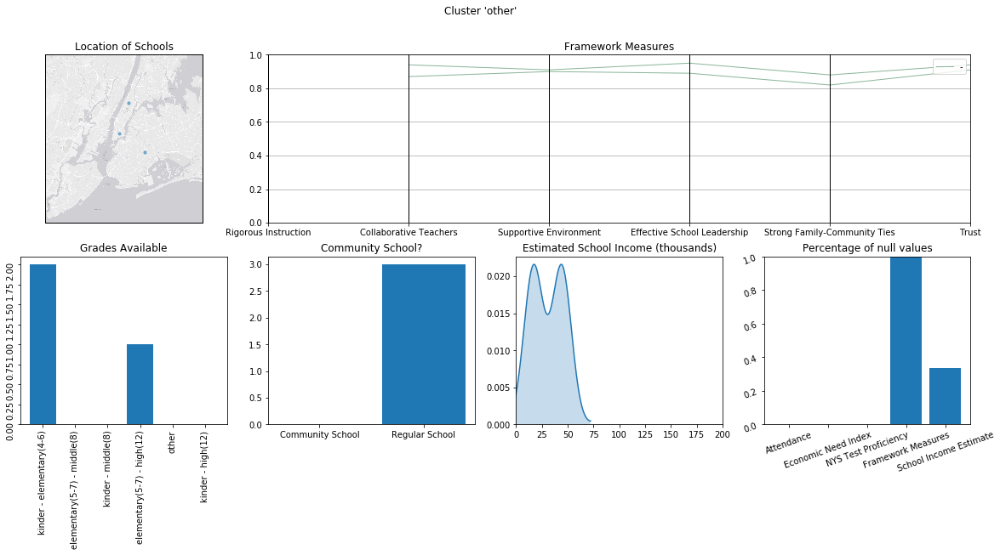

#### Students Characteristics

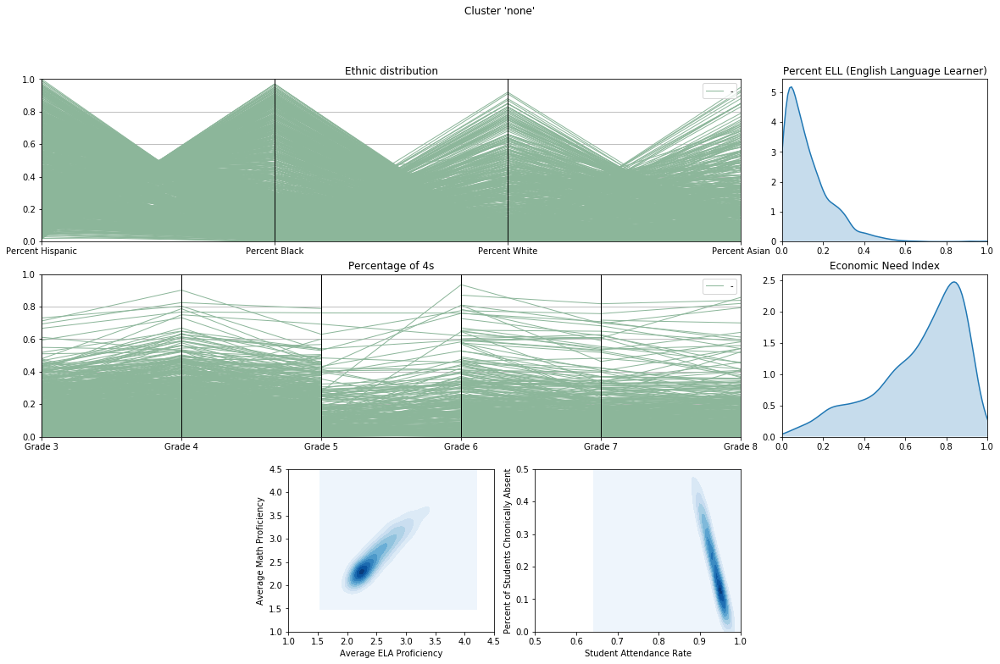

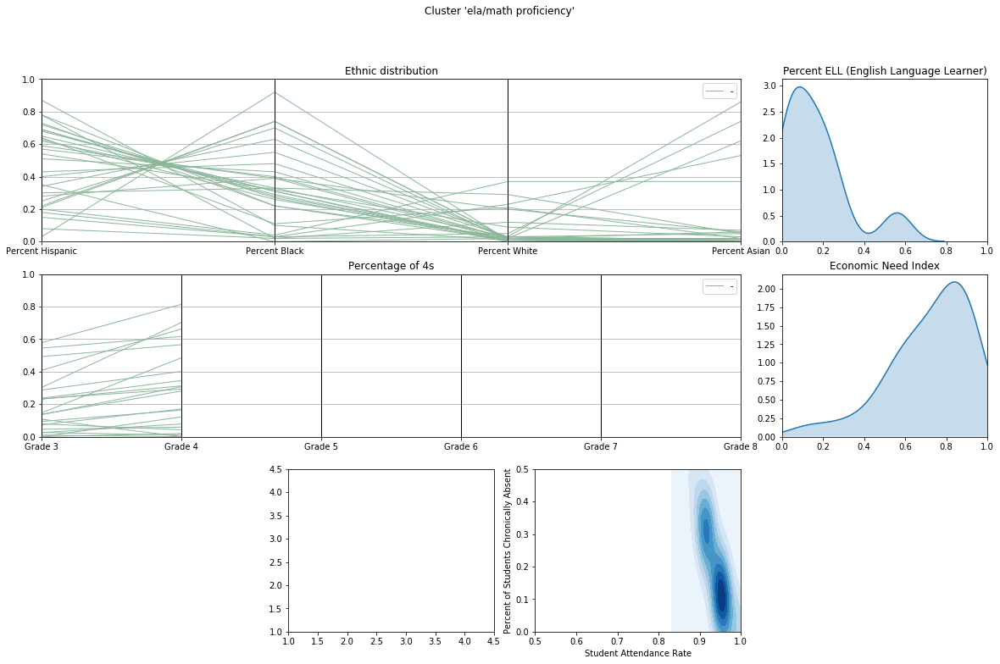

/home/andre/miniconda3/envs/passnyc/lib/python3.6/site-packages/seaborn/distributions.py:195: RuntimeWarning: Mean of empty slice.
  line, = ax.plot(a.mean(), 0)
/home/andre/miniconda3/envs/passnyc/lib/python3.6/site-packages/numpy/core/_methods.py:80: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


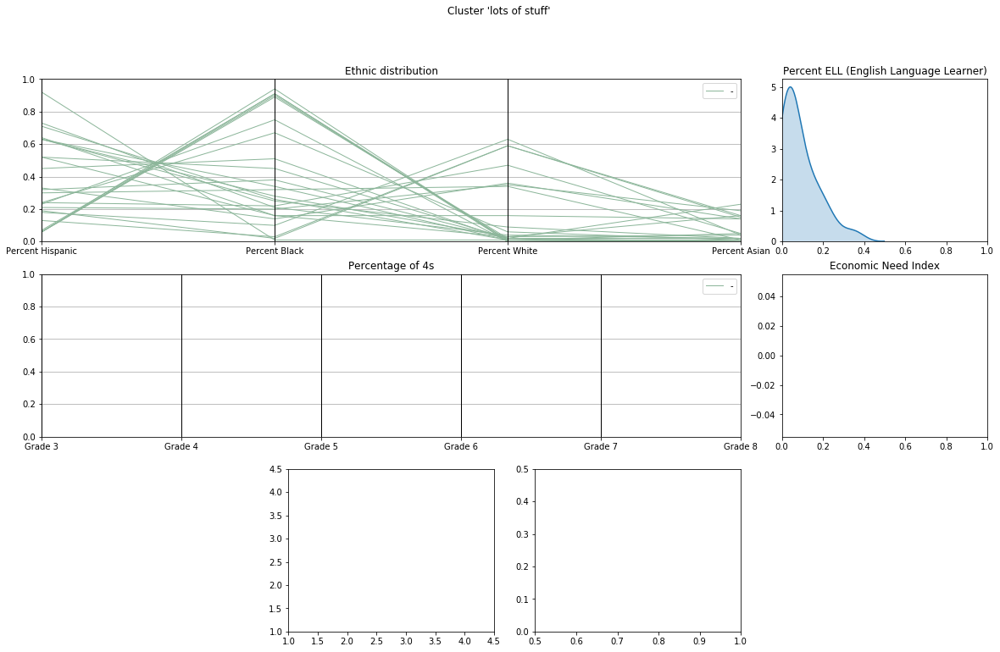

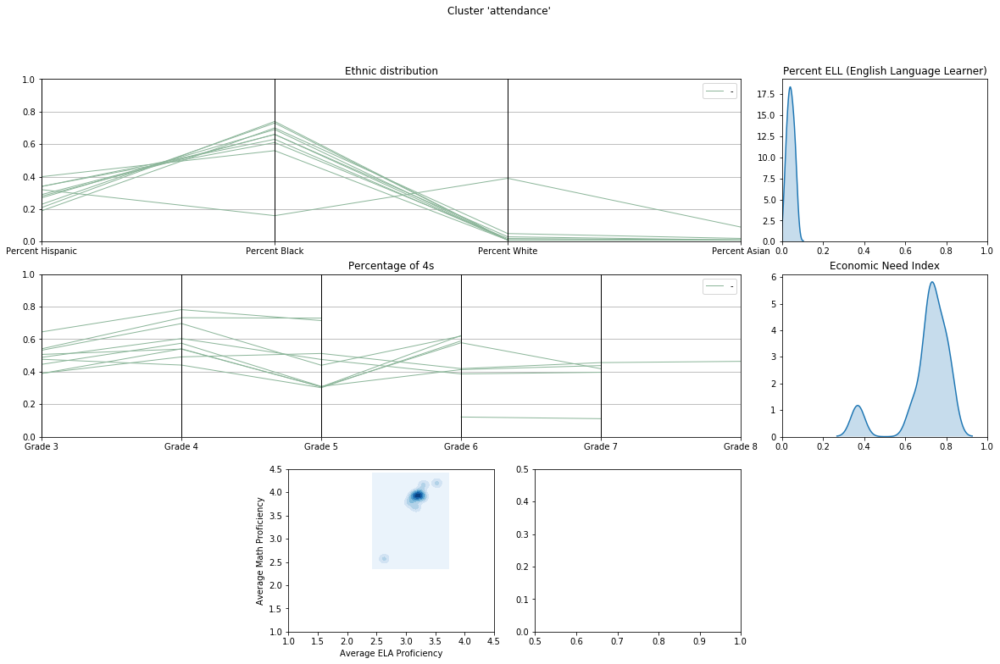

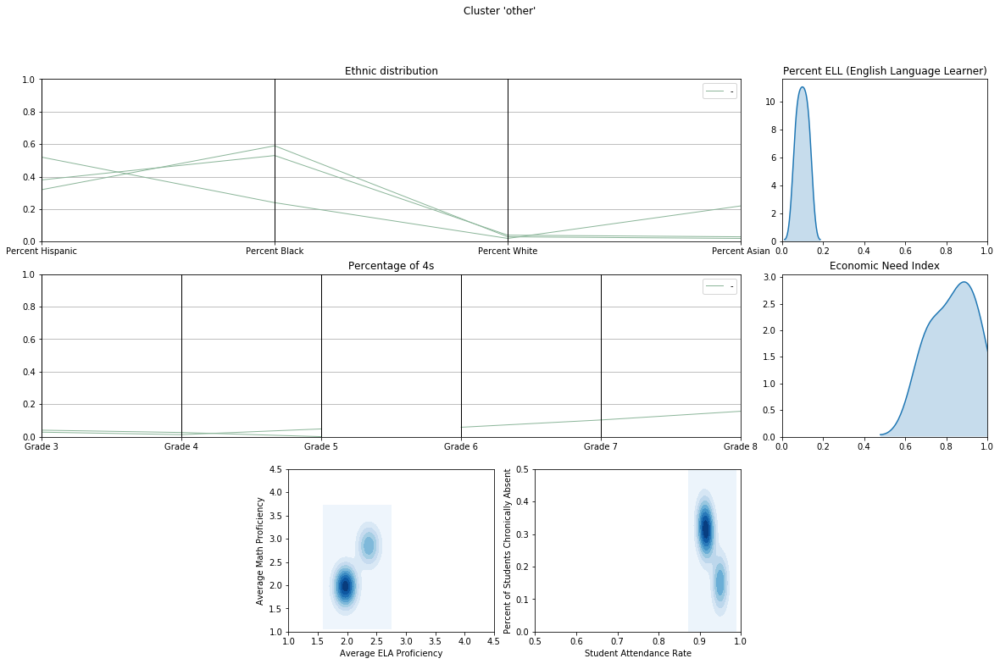

In [65]:
def get_null_columns(x):
    return tuple([c for c in x[x.isnull()].index if c != 'School Income Estimate'])

def summarize_null_columns(columns):
    return {
        (): 'none',
        ('Average ELA Proficiency', 'Average Math Proficiency'): 'ela/math proficiency',
        ('Student Attendance Rate', 'Percent of Students Chronically Absent'): 'attendance',
        ('Economic Need Index',
          'Student Attendance Rate',
          'Percent of Students Chronically Absent',
          'Rigorous Instruction %',
          'Collaborative Teachers %',
          'Supportive Environment %',
          'Effective School Leadership %',
          'Strong Family-Community Ties %',
          'Trust %',
          'Average ELA Proficiency',
          'Average Math Proficiency'): 'lots of stuff'
    }.get(columns, 'other')

null_columns = df.apply(get_null_columns, axis=1).apply(summarize_null_columns).rename('Null columns')
plot_clusters(null_columns, df)

#### Remarks

Overall it's difficult to say something because there are so few schools.

- Schools without ELA/Math proficiency have the amount of 4s in the 3rd and 4th grade only
- Schools without attendance information seem to have a higher amount of high-performant students and are mostly localized in Manhattan